<a href="https://colab.research.google.com/github/Akshata-Varude/Netflix-Movies-TV-Shows-Clustering---Unsupervised-ML/blob/main/Netflix_Movies_%26_TV_Shows_Clustering_Unsupervised_ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name - Netflix Movies and TV Shows Clustering**


##### **Project Type**    - Clustering
##### **Contribution**    - Indivisual
##### **Member Name -** Akshata Vivek Varude


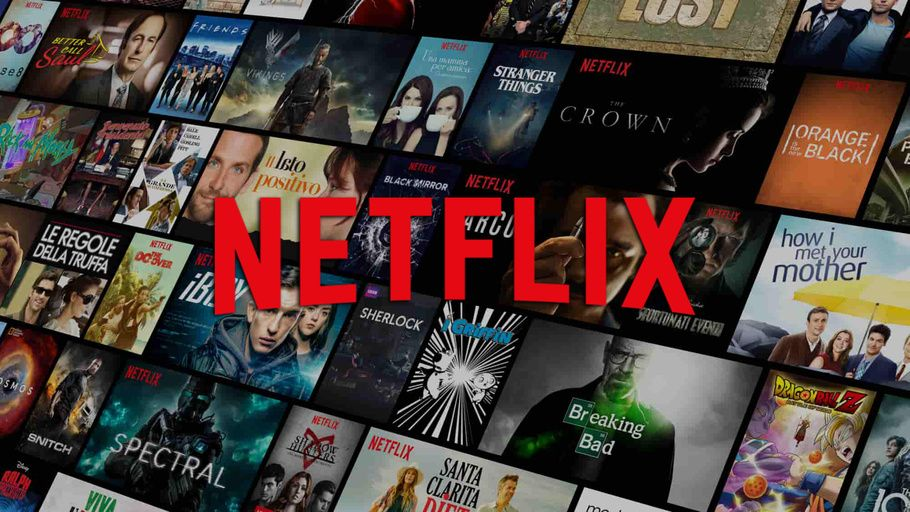

# **Project Summary -**

The entertainment industry is highly competitive, and success depends on various factors such as genre, rating, production budget, cast, and more. A study was conducted to analyze the factors that impact the popularity of movies and TV shows on Netflix. The study utilized a dataset with approximately 12 variables to cluster movies and TV shows based on their popularity and audience preferences.

To begin the analysis, data wrangling was performed, which involved handling missing values and checking unique values. The study found that there were 2389 missing values for the 'director' column, 718 for the 'cast' column, 507 for the 'country' column, and 10 for the 'date_added' column. These missing values were eliminated by dropping the corresponding rows.

Next, exploratory data analysis (EDA) was conducted. The number of movies on Netflix exceeds the number of TV shows, with 5372 movies and 2398 TV shows currently available on the platform. The most common rating for TV shows is TV-MA, indicating a significant proportion of adult-oriented TV shows on Netflix. Moreover, TV-MA is also the most common rating for both movies and TV shows, suggesting that Netflix's content predominantly caters to an adult demographic, focusing on mature and potentially controversial themes.

The years 2017 and 2018 witnessed the highest number of movie releases, while 2020 had the highest number of TV show releases. The growth rate of movie releases on Netflix is significantly higher than that of TV shows. Since 2015, there has been a substantial increase in the number of movies and TV show episodes available on Netflix. However, there has been a noticeable decline in the production of movies and TV show episodes after 2020, indicating that Netflix has prioritized expanding its movie content over TV shows.

Based on the countplot, it can be observed that Netflix adds the highest number of movies and TV shows between October and January. This period seems to be the busiest time of the year for Netflix in terms of introducing new content to its platform. The United States has the highest number of content offerings on Netflix, followed by India, which boasts the highest number of movies.

To cluster the shows, the study focused on six key attributes: director, cast, country, genre, rating, and description. These attributes were transformed into a 10,000-feature TFIDF vectorization, and Principal Component Analysis (PCA) was utilized to reduce the components to 3000, capturing more than 80% of the variance.

Two clustering algorithms, namely K-Means and Agglomerative clustering, were employed to group the shows. K-Means identified 5 as the optimal number of clusters, while Agglomerative clustering suggested 7 clusters. These clusters were visualized using a dendrogram.

Finally, a content-based recommender system was developed using the similarity matrix obtained through cosine similarity. This system offers personalized recommendations based on the user's watched shows, providing them with 10 top-notch suggestions to explore.

In conclusion, the study highlighted significant trends in the Netflix dataset, including the contrasting growth rates of movies and TV shows, the busiest period for adding new content, and the content demographics. Through clustering and a content-based recommender system, personalized recommendations based on the user's viewing history were generated. This study provides valuable insights into the factors influencing the popularity of movies and TV shows on Netflix, establishing a basis for further research and analysis.

# **GitHub Link -**

https://github.com/Akshata-Varude/Netflix-Movies-TV-Shows-Clustering---Unsupervised-ML/tree/0411daefac28f2b7066be372145f6f7be0201c65

# **Problem Statement**

This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine.

In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings

In this project, you are required to do

1.Exploratory Data Analysis.

2.Understanding what type content is available in different countries.

3.Is Netflix has increasingly focusing on TV rather than movies in recent years.

4.Clustering similar content by matching text-based features.

# **General Guidelines** : -

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.


# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
from sklearn.metrics import silhouette_score
from wordcloud import WordCloud, STOPWORDS
from pylab import rcParams
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics.pairwise import cosine_similarity
import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
data = pd.read_csv("/content/drive/My Drive/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv")

### Dataset First View

In [5]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [6]:
data.tail()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


### Dataset Rows & Columns count

In [ ]:
data.shape

(7787, 12)

### Dataset Information

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
data[data.duplicated()]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description


In [ ]:
duplicate_value_count = len(data[data.duplicated()])

print('Number of duplicates value present is:',duplicate_value_count)

Number of duplicates value present is: 0


#### Missing Values/Null Values

In [ ]:
data.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

<Axes: >

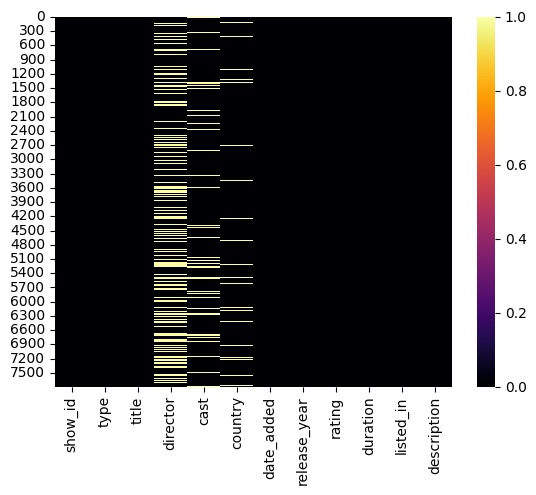

In [ ]:
sns.heatmap(data.isnull(),cmap='inferno',cbar=True)

### What did you know about your dataset?

1.Dataset contains 7787 no.of.rows and 12 no.of.columns

2.No duplicate value present in the dataset.

3.5 no. of columns contain the missing value.

4.there are 3671 no.of.missing value present in the dataset.

## ***2. Understanding Your Variables***

In [ ]:
data.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
print(f'There are {len(data.columns)} columns present in the dataset')

There are 12 columns present in the dataset


In [ ]:
data.describe(include='all')

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7787.000000,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1565,NaN,14,216,492,7769
top,s1,Movie,3%,"Raúl Campos, Jan Suter",David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,118,NaN,2863,1608,334,3
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.932580,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.757395,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018.000000,NaN,NaN,NaN,NaN


### Variables Description


**show_id**: Unique ID for every Movie / Tv Show.

**type**: Identifier - A Movie or TV Show.

**title**: Title of the Movie / Tv Show.

**director**: Director of the Movie / Show.

**cast**: Actors involved in the Movie / Show.

**country**: Country where the Movie / Show was produced.

**date_added**: Date it was added on Netflix.

**release_year**: Actual release year of the Movie / Show.

**rating**: TV Rating of the Movie / Show.

**duration**: Total Duration - in minutes or number of seasons.

**listed_in**: Genre.

**description**: The Summary description.



### Check Unique Values for each variable.

In [ ]:
for column in data.columns:
  unique_values = data[column].unique()

  print(f"Unique values {column}:{unique_values}")


Unique values show_id:['s1' 's2' 's3' ... 's7785' 's7786' 's7787']
Unique values type:['TV Show' 'Movie']
Unique values title:['3%' '7:19' '23:59' ... 'Zulu Man in Japan' "Zumbo's Just Desserts"
 "ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS"]
Unique values director:[nan 'Jorge Michel Grau' 'Gilbert Chan' ... 'Josef Fares' 'Mozez Singh'
 'Sam Dunn']
Unique values cast:['João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso Frateschi'
 'Demián Bichir, Héctor Bonilla, Oscar Serrano, Azalia Ortiz, Octavio Michel, Carmen Beato'
 'Tedd Chan, Stella Chung, Henley Hii, Lawrence Koh, Tommy Kuan, Josh Lai, Mark Lee, Susan Leong, Benjamin Lim'
 ...
 'Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanana, Manish Chaudhary, Meghna Malik, Malkeet Rauni, Anita Shabdish, Chittaranjan Tripathy'
 'Nasty C' 'Adriano Zumbo, Rachel Khoo']
Unique values country:['Brazil' 'Mexico' 'Singapore' 'United States' 'Tur

In [ ]:
data.nunique()

show_id         7787
type               2
title           7787
director        4049
cast            6831
country          681
date_added      1565
release_year      73
rating            14
duration         216
listed_in        492
description     7769
dtype: int64

## 3. ***Data Wrangling***

#### Missing Values/Null Values

In [ ]:
data.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

In [ ]:
round(data.isna().sum()/len(data)*100,2)

show_id          0.00
type             0.00
title            0.00
director        30.68
cast             9.22
country          6.51
date_added       0.13
release_year     0.00
rating           0.09
duration         0.00
listed_in        0.00
description      0.00
dtype: float64

## What all manipulations have you done and insights you found?

1.The null values of column director replaced by NA.

2.The null values of column cast can replaced by no_cast.

3.The null values of column country can be replaced by most frequant value occur in the column(mode).

4.the null of column date_added and rating are removed.

5.Verified if null value still present or not.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

In [ ]:
data.type.value_counts()

Movie      5377
TV Show    2410
Name: type, dtype: int64

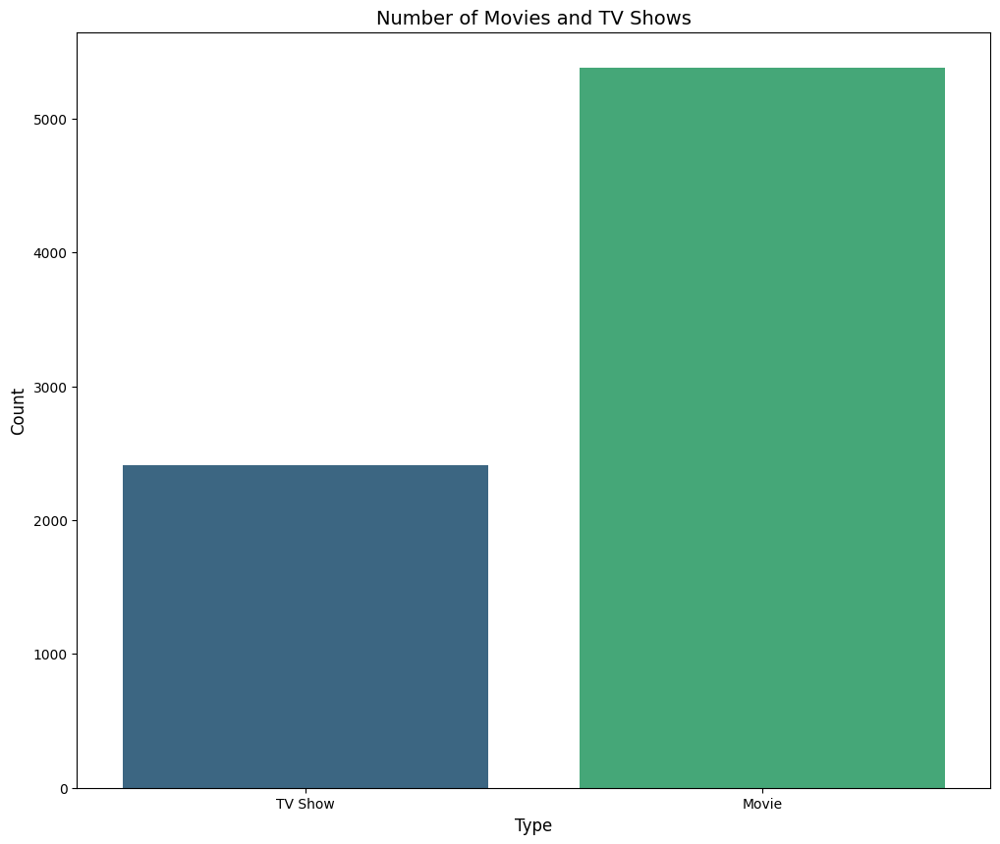

In [ ]:
sns.set_style='darkgrid'
fig, ax = plt.subplots(figsize=(12,10))

sns.countplot(x='type',data=data,palette='viridis',ax = ax)
ax.set_title('Number of Movies and TV Shows', fontsize=14)
ax.set_xlabel('Type', fontsize=12)
ax.set_ylabel('Count', fontsize=12)
plt.show()

#####1. Why did you pick the specific chart?

**Using a countplot, a type of bar chart, is an excellent option for visually representing categorical data like the number of movies and TV shows on Netflix. This method effectively illustrates the frequency of each category in a straightforward and easily understandable manner.**

#####2. What is/are the insight(s) found from the chart?

**From above countplot we get insight that 5372 no.of.movies and 2398 no.of.Tv show available in the netflix dataset.**

#####3. Will the gained insights help creating a positive business impact?Are there any insights that lead to negative growth? Justify with specific reason.

**While the fact that Netflix has more movies than TV shows may not significantly impact the business alone, it can be valuable when combined with other data to make informed decisions. For instance, if Netflix observes that its subscribers prefer TV shows over movies, it might prioritize acquiring more TV show content. Conversely, if their original movies gain popularity, they may invest more resources in that aspect.**

#### Chart - 2

In [ ]:
ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}

data['target_age'] = data['rating'].map(ratings)

In [ ]:
data['type'] = pd.Categorical(data['type'])

In [ ]:
data['target_age'] = pd.Categorical(data['target_age'], categories=['Kids', 'Older Kids', 'Teens', 'Adults'])

In [ ]:
data

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_age
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...,Adults
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...,Teens
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast...",Adults
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...,Older Kids


In [ ]:
movie= data[data['type']=='Movie']
tv_show = data[data['type']=='TV Show']

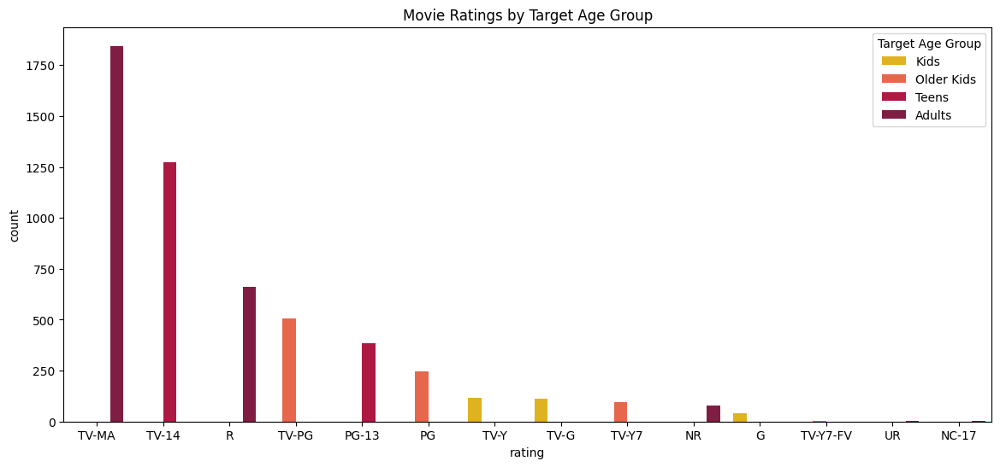

In [ ]:
colors = ["#FFC300", "#FF5733", "#C70039", "#900C3F"]

# Plotting a countplot to show the movie ratings based on target age groups
plt.figure(figsize=(14,6))
plt.title('Movie Ratings by Target Age Group')

sns.countplot(x=movie['rating'], hue=movie['target_age'], data=movie,
              order=movie['rating'].value_counts().index, palette=colors)

# Adding a legend to the plot
plt.legend(title='Target Age Group', loc='upper right', labels=['Kids', 'Older Kids', 'Teens', 'Adults'])

# Visualization of the chart
plt.show()

#####1. Why did you pick the specific chart?

**The reason for selecting this chart is its ability to present the distribution of Movies ratings in a clear and succinct manner. The bars facilitate straightforward comparisons between various ratings, and the descending order by count accentuates the prevalence of TV-MA. As a result, this chart offers a swift and informative snapshot of the ratings landscape for Movies on Netflix.**



#####2. What is/are the insight(s) found from the chart?

**Based on the dataset, TV-MA emerges as the most prevalent rating for movies on Netflix. This indicates a substantial portion of the platform's content is targeted towards adult audiences. The abundance of TV-MA ratings implies that Netflix's content predominantly caters to a mature demographic, featuring themes that may be intended for more mature viewers and potentially addressing controversial subjects.**

#####3. Will the gained insights help creating a positive business impact?Are there any insights that lead to negative growth? Justify with specific reason

**The insights gained from the prevalence of TV-MA ratings can positively influence Netflix's business strategy. By recognizing the popularity of adult-oriented content, Netflix can continue to prioritize the production and acquisition of material that appeals to mature audiences. This strategy can help attract and retain subscribers interested in such themes while allowing the company to tailor its marketing efforts to specific age groups associated with different ratings**.

**However, there is a potential downside to consider. Some subscribers might be dissuaded by the abundance of mature content, especially those seeking family-friendly programming. Consequently, there is a risk of losing subscribers who are not comfortable with adult themes. To maintain a balanced approach and prevent alienating specific demographics, Netflix should carefully curate its content offerings to cater to a wide range of viewers**.

#### Chart - 3

Text(0.5, 1.0, 'Tv shows ratings')

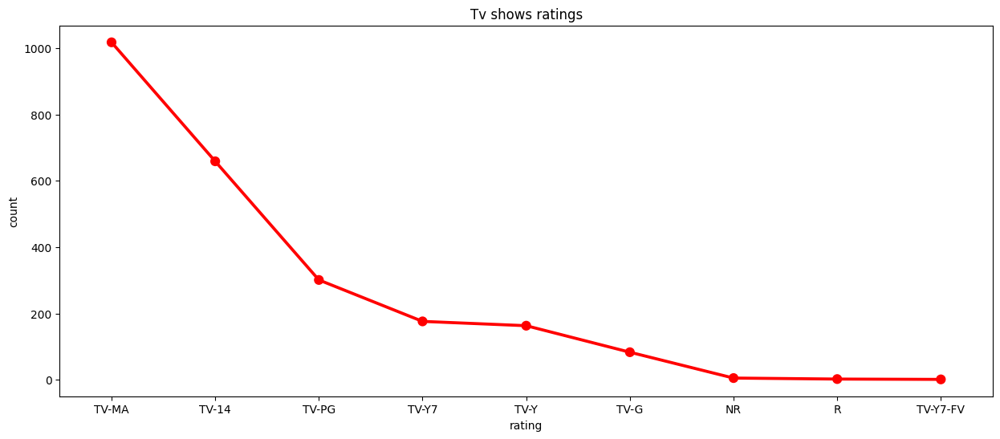

In [ ]:
tv_ratings = tv_show.groupby(['rating'])['show_id'].count().reset_index(name='count').sort_values(by='count',ascending=False)

plt.figure(figsize=(15,6))
sns.pointplot(x = 'rating', y = 'count', data=tv_ratings, color='Red')

plt.title('Tv shows ratings')


#####1. Why did you pick the specific chart?

**The reason for selecting this chart is its ability to present the distribution of TV Shows ratings in a clear and succinct manner. The bars facilitate straightforward comparisons between various ratings, and the descending order by count accentuates the prevalence of TV-MA. As a result, this chart offers a swift and informative snapshot of the ratings landscape for TV Shows on Netflix.**

#####2. What is/are the insight(s) found from the chart?

**Based on the dataset, TV-MA emerges as the most prevalent rating for TV Shows on Netflix. This indicates a substantial portion of the platform's content is targeted towards adult audiences. The abundance of TV-MA ratings implies that Netflix's content predominantly caters to a mature demographic, featuring themes that may be intended for more mature viewers and potentially addressing controversial subjects.**

#####3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason

**The insights gained from the prevalence of TV-MA ratings can positively influence Netflix's business strategy. By recognizing the popularity of adult-oriented content, Netflix can continue to prioritize the production and acquisition of material that appeals to mature audiences. This strategy can help attract and retain subscribers interested in such themes while allowing the company to tailor its marketing efforts to specific age groups associated with different ratings.**

**However, there is a potential downside to consider. Some subscribers might be dissuaded by the abundance of mature content, especially those seeking family-friendly programming. Consequently, there is a risk of losing subscribers who are not comfortable with adult themes. To maintain a balanced approach and prevent alienating specific demographics, Netflix should carefully curate its content offerings to cater to a wide range of viewers.**

#### Chart - 4

In [ ]:
movie_released_year = movie['release_year'].value_counts().sort_index(ascending=False)

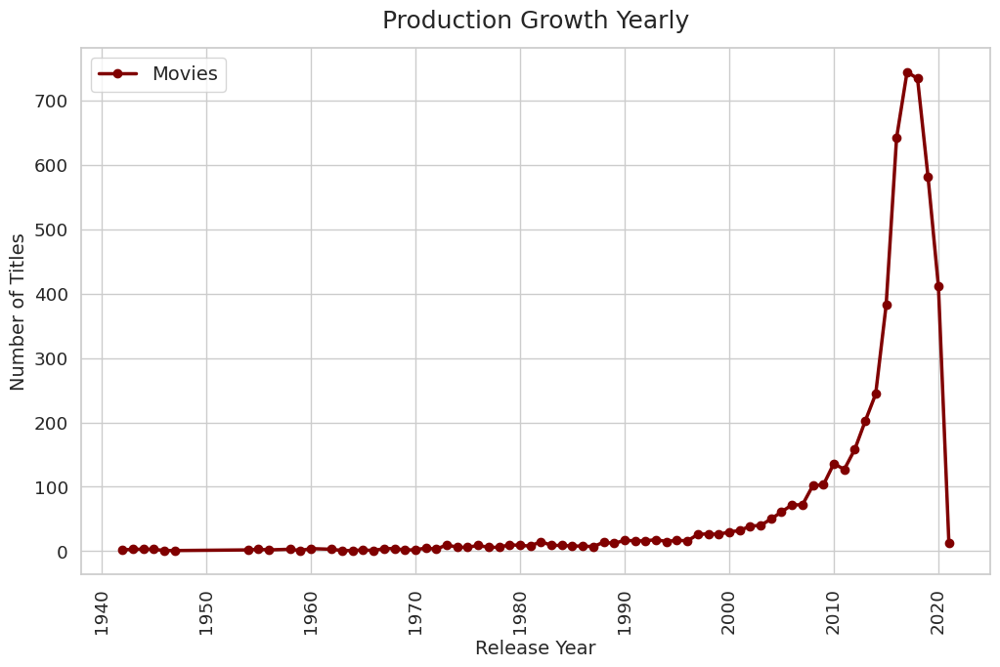

In [ ]:
sns.set(style='whitegrid', font_scale=1.2)

# Creating a new figure and axis
fig, ax = plt.subplots(figsize=(12, 7))

# Plotting the data using the axis object
ax.plot(movie_released_year.index, movie_released_year.values, color='maroon', label='Movies', linewidth=2.5, marker='o')


# Customizing the plot
plt.xticks(rotation=90)
ax.set_xlabel('Release Year', fontsize=14)
ax.set_ylabel('Number of Titles', fontsize=14)
ax.set_title('Production Growth Yearly', fontsize=18, pad=15)
ax.legend(fontsize=14)

# Showing the plot
plt.show()

**Extracting the last 20 years from the dataset.**

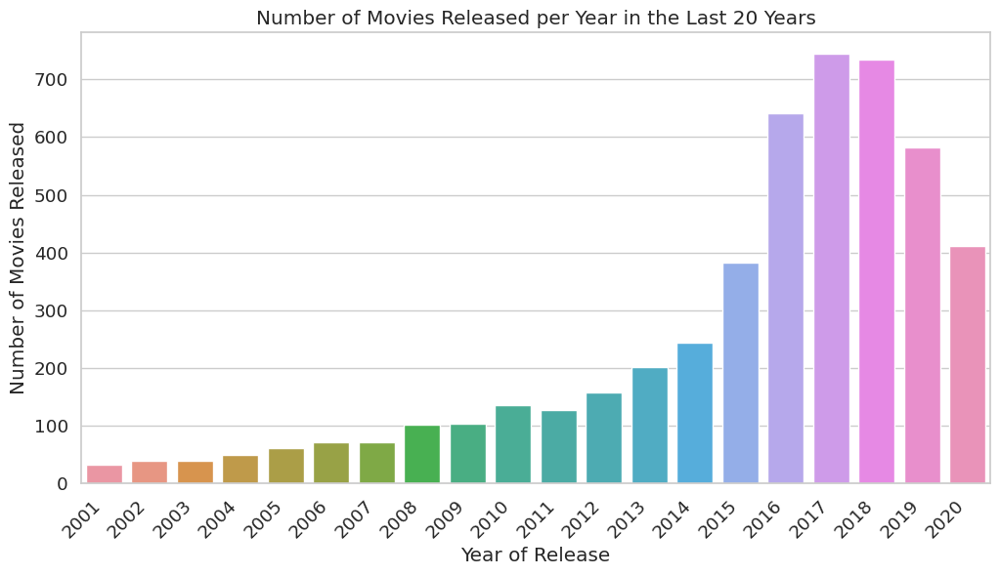

In [ ]:
last_20_years = range(2001,2021)

movies_last_20_years = movie[movie['release_year'].isin(last_20_years)]

sns.set_palette('mako')
fig, ax = plt.subplots(figsize=(12, 6))
sns.countplot(x='release_year', data=movies_last_20_years, order=last_20_years, ax=ax)
plt.xticks(rotation=45, ha='right')
ax.set_xlabel('Year of Release')
ax.set_ylabel('Number of Movies Released')
ax.set_title('Number of Movies Released per Year in the Last 20 Years')

plt.show()

#####1. Why did you pick the specific chart?

**The most suitable charts for displaying the number of movies released per year from 2001 to 2019 would be a countplot. Another option could be a stacked bar chart or a stacked area chart, which can show the proportion of movies released in each year.**

#####2. What is/are the insight(s) found from the chart?


**1. The years 2017 and 2018 saw the highest number of movie releases.**

**2. Since 2015, there has been a substantial increase in the quantity of movies.**

**3. After 2019, there has been a noticeable decline in the number of movies.**

#####3. Will the gained insights help creating a positive business impact?Are there any insights that lead to negative growth? Justify with specific reason.

**The insights derived from the analysis could positively impact Netflix's business strategy. The data indicates that focusing on increasing movie content could be a successful approach, attracting and retaining more viewers. However, the sharp decline in content production after 2019 may raise concerns for the company, suggesting possible challenges in production or other streaming apps is avalable which create a major compitation. If this trend persists, negative growth could occur, prompting viewers to seek other streaming services with a broader content selection.**

#### Chart - 5

In [ ]:
tv_show_released_year = tv_show['release_year'].value_counts().sort_index(ascending=False)

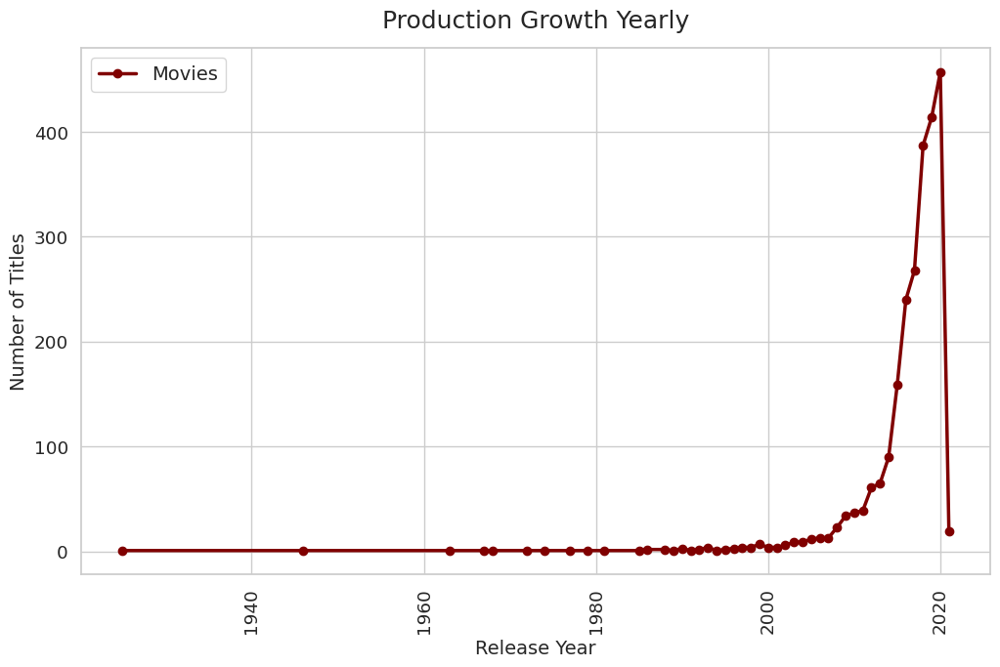

In [ ]:
sns.set(style='whitegrid', font_scale=1.2)

# Creating a new figure and axis
fig, ax = plt.subplots(figsize=(12, 7))

# Plotting the data using the axis object
ax.plot(tv_show_released_year.index, tv_show_released_year.values, color='maroon', label='Movies', linewidth=2.5, marker='o')


# Customizing the plot
plt.xticks(rotation=90)
ax.set_xlabel('Release Year', fontsize=14)
ax.set_ylabel('Number of Titles', fontsize=14)
ax.set_title('Production Growth Yearly', fontsize=18, pad=15)
ax.legend(fontsize=14)

# Showing the plot
plt.show()

In [ ]:
tv_show_released_year

2021     19
2020    457
2019    414
2018    387
2017    268
2016    240
2015    159
2014     90
2013     65
2012     61
2011     39
2010     37
2009     34
2008     23
2007     13
2006     13
2005     12
2004      9
2003      9
2002      6
2001      4
2000      4
1999      7
1998      4
1997      4
1996      3
1995      2
1994      1
1993      4
1992      2
1991      1
1990      3
1989      1
1988      2
1986      2
1985      1
1981      1
1979      1
1977      1
1974      1
1972      1
1968      1
1967      1
1963      1
1946      1
1925      1
Name: release_year, dtype: int64

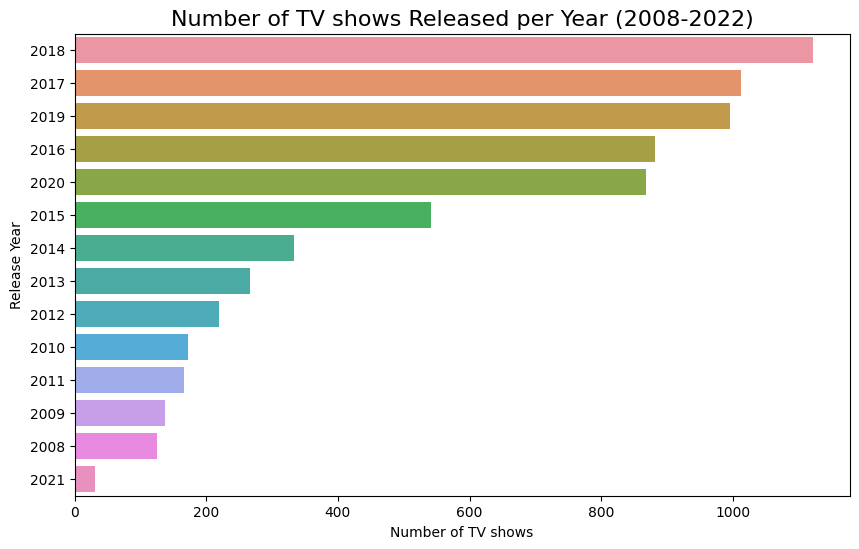

In [7]:
TV_Shows_last_15_years = data[data['release_year'] >= 2008]

# Setting the style
sns.set_palette('pastel')

# Creating a new figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Creating a count plot using the axis object with horizontal bars
sns.countplot(y='release_year', data=TV_Shows_last_15_years, order=TV_Shows_last_15_years['release_year'].value_counts().index[:15], ax=ax)

# Customizing the plot
ax.set_title('Number of TV shows Released per Year (2008-2022)', fontsize=16)
ax.set_xlabel('Number of TV shows')
ax.set_ylabel('Release Year')

# Showing the plot
plt.show()



#####1. Why did you pick the specific chart?

**The most suitable charts for displaying the number of movies released per year from 2008 to 2020 would be a countplot. Another option could be a stacked bar chart or a stacked area chart, which can show the proportion of movies released in each year**.

#####2. What is/are the insight(s) found from the chart?

**1. 2020 had the highest number of TV show releases**

**2. Since 2015, there has been a substantial increase in the quantity of TV Shows.**

**3.  However, after 2020, there has been a noticeable decline in the number of TV Shows.**

#####3. Will the gained insights help creating a positive business impact?

**The insights derived from the analysis could positively impact Netflix's business strategy. The data indicates that focusing on increasing movie content could be a successful approach, attracting and retaining more viewers. However, the sharp decline in content production after 2019 may raise concerns for the company, suggesting possible challenges in production or other streaming apps is avalable which create a major compitation. If this trend persists, negative growth could occur, prompting viewers to seek other streaming services with a broader content selection.**

#### Chart - 6

In [ ]:
data['month'] = pd.DatetimeIndex(data['date_added']).month

In [ ]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_age,month
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults,8.0
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults,12.0
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults,12.0
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens,11.0
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens,1.0


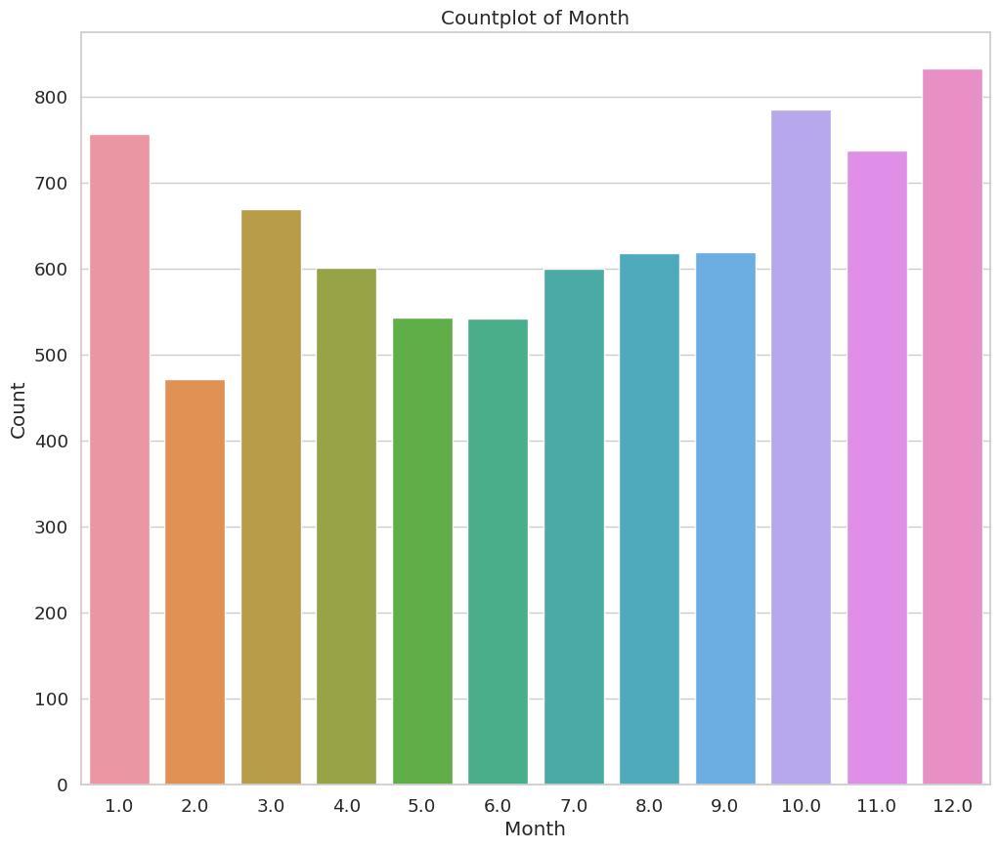

In [ ]:
plt.figure(figsize=(12, 10))
sns.set_palette('deep')
sns.countplot(x='month', data=data)
plt.title('Countplot of Month')
plt.xlabel('Month')

plt.ylabel('Count')
plt.show()


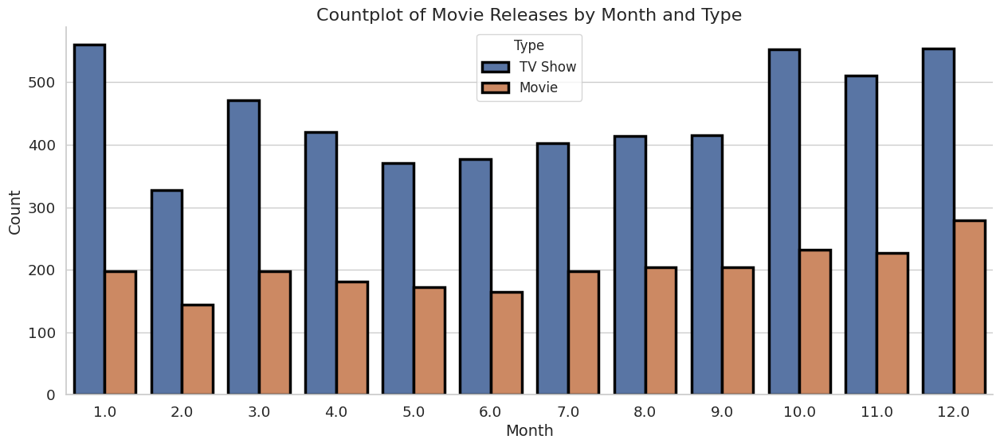

In [ ]:
fig, ax = plt.subplots(figsize=(15, 6))
sns.set_palette('deep')

sns.countplot(x='month', hue='type', data=data, edgecolor='black', linewidth=2.5, ax=ax)
ax.set_title('Countplot of Movie Releases by Month and Type', fontsize=16)
ax.set_xlabel('Month', fontsize=14)
ax.set_ylabel('Count', fontsize=14)

legend_labels = data['type'].unique()
ax.legend(labels=legend_labels, fontsize=12, title='Type', title_fontsize=12)

sns.despine()
plt.show()


#####1. Why did you pick the specific chart?

**The chosen chart, a countplot with hue, is highly effective for visualizing and comparing the number of movies and TV shows added to Netflix each month. By using the hue parameter, we can clearly observe the individual contributions of movies and TV shows to the overall count for each month. This allows us to easily spot any patterns or trends in the data.**

**Notably, the countplot reveals a significant surge in the addition of both movies and TV shows to Netflix from October to January. This information holds crucial importance for Netflix and content creators, as it indicates a period when audience interest in new content is likely to be at its peak. As a result, this time frame could be strategically advantageous for releasing new content to potentially maximize viewership and overall success**.

#####2. What is/are the insight(s) found from the chart?

**Based on the countplot, it is evident that Netflix experiences its peak in adding movies and TV shows during the months spanning from October to January. This timeframe appears to be the most active and bustling period for Netflix in terms of introducing fresh content to its platform.**

#####3. Will the gained insights help creating a positive business impact?Are there any insights that lead to negative growth? Justify with specific reason.

**1. Understanding that the majority of content is added to Netflix between October and January can potentially yield positive business outcomes. This information enables Netflix to strategize their content acquisition and release schedule effectively, maximizing user engagement during these months. For instance, they could focus on acquiring and releasing more popular titles during this period to attract and retain users.**

**2. Nevertheless, it is crucial to acknowledge that relying solely on the countplot may not be enough to achieve a significant positive impact. To create a comprehensive content acquisition and release strategy, Netflix must analyze user viewing patterns, preferences, and closely monitor competition and market trends.**

**3. In terms of negative growth, the countplot itself does not provide specific insights that lead to negative growth. However, if Netflix were to solely depend on this plot and overlook critical factors like user preferences, shifting market trends, and competitive landscape, it could potentially lead to negative growth due to an inadequate content selection and acquisition strategy.**

#### Chart - 7

In [8]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [ ]:
top_15_country_content = data['country'].value_counts().index[0:15]

In [ ]:
top_15_country_content

Index(['United States', 'India', 'United Kingdom', 'Japan', 'South Korea',
       'Canada', 'Spain', 'France', 'Egypt', 'Turkey', 'Mexico', 'Australia',
       'Taiwan', 'Brazil', 'Philippines'],
      dtype='object')

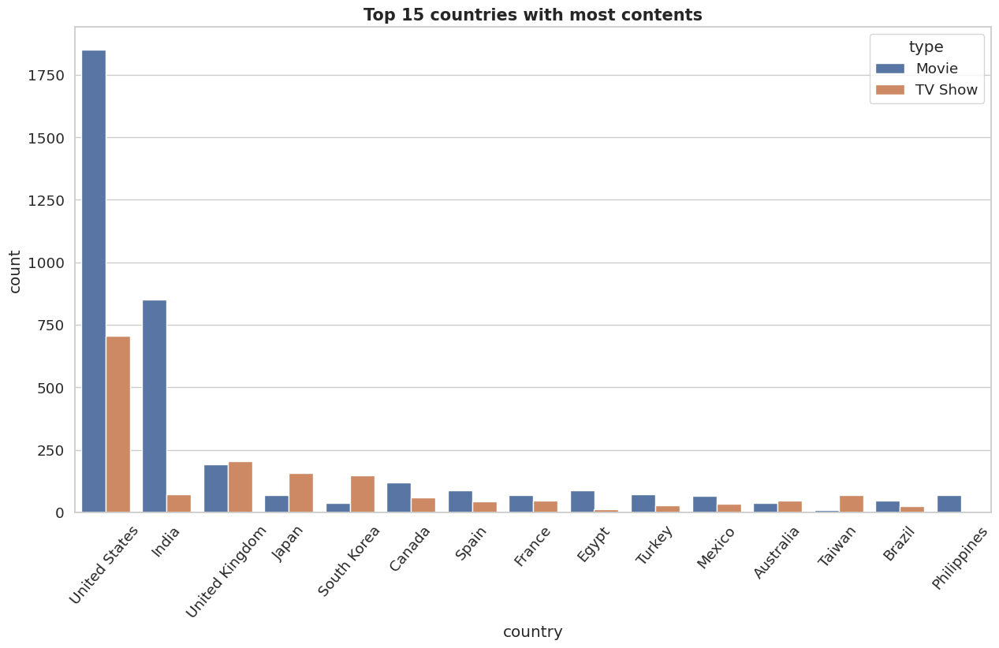

In [ ]:
plt.figure(figsize=(15,8))
sns.countplot(x=data['country'],order = top_15_country_content,hue=data['type'])
plt.xticks(rotation=50)
plt.title('Top 15 countries with most contents', fontsize=15, fontweight='bold')
plt.show()

In [ ]:
country_count = data['country'].value_counts().reset_index()
country_count

,index,country
0,United States,2555
1,India,923
2,United Kingdom,397
3,Japan,226
4,South Korea,183
...,...,...
676,"Russia, United States, China",1
677,"Italy, Switzerland, France, Germany",1
678,"United States, United Kingdom, Canada",1
679,"United States, United Kingdom, Japan",1


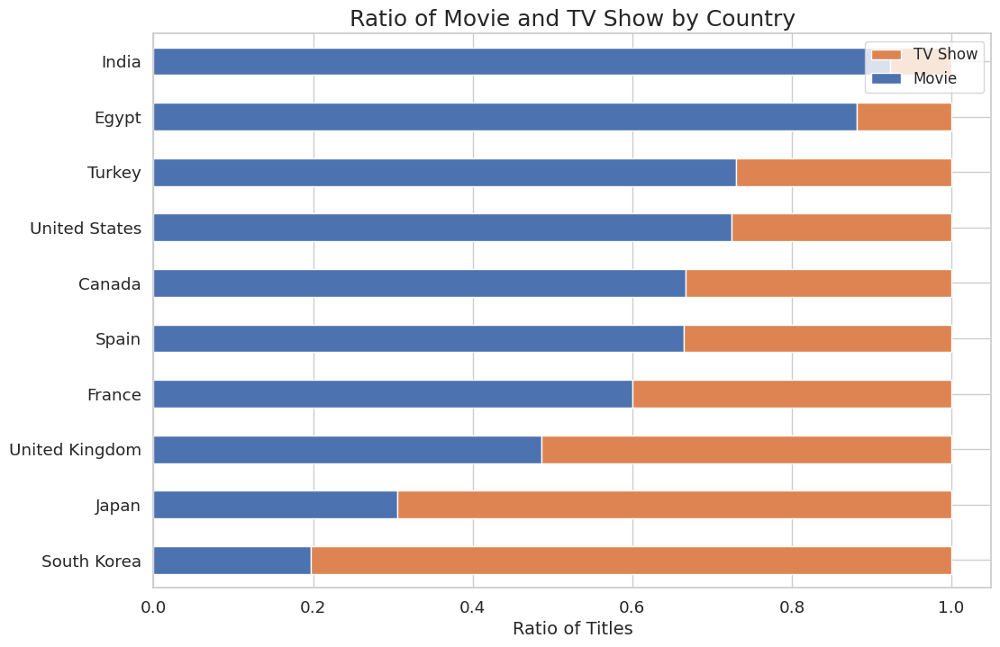

In [ ]:
# Top 10 countries by count of titles
country_order = data['country'].value_counts()[:10].index

# Create a dataframe with count of movie and TV show for each country
content_data = data[['type', 'country']].groupby('country')['type'].value_counts().unstack().loc[country_order]

# Add a column for total count of titles
content_data['total'] = content_data.sum(axis=1)

# Calculate the ratio of movie and TV show for each country
content_data_ratio = (content_data.T / content_data['total']).T[['Movie', 'TV Show']]


# Sort the dataframe by movie ratio and plot the horizontal bar chart
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
content_data_ratio.sort_values(by='Movie').plot(kind='barh', stacked=True, ax=ax)

# Set the x-axis label and title
ax.set_xlabel('Ratio of Titles', fontsize=14)
ax.set_title('Ratio of Movie and TV Show by Country', fontsize=18)

# Set the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels), fontsize=12, loc='upper right')

In [ ]:
# Preparing data for heatmap
data['count'] = 1
data_df = data.groupby('country')['count'].sum().sort_values(ascending=False).reset_index()[:10]
top_countries = data_df['country']


df_heatmap = data[data['country'].isin(top_countries)]
df_heatmap = pd.crosstab(df_heatmap['country'],df_heatmap['target_age'],normalize = "index")
df_heatmap = df_heatmap.T
df_heatmap

country,Canada,Egypt,France,India,Japan,Mexico,South Korea,Spain,United Kingdom,United States
target_age,,,,,,,,,,
Kids,0.180791,0.000000,0.095652,0.016251,0.008889,0.02,0.027322,0.022388,0.093199,0.073276
Older Kids,0.225989,0.039604,0.060870,0.160347,0.271111,0.07,0.120219,0.044776,0.204030,0.187696
Teens,0.146893,0.683168,0.165217,0.567714,0.355556,0.14,0.382514,0.097015,0.188917,0.237069
Adults,0.446328,0.277228,0.678261,0.255688,0.364444,0.77,0.469945,0.835821,0.513854,0.501959


##### 1. Why did you pick the specific chart?

**Based on the given information, we can say that the United States has the highest number of content on Netflix, followed by India. Additionally, India has the highest number of movies on Netflix.**

**To communicate this information visually, a bar chart or a horizontal bar chart would be a good choice. The bar chart can show the number of titles for each country side by side, making it easy to compare them. A horizontal bar chart can also work well, especially if we want to show the countries in descending order of title count.**

##### 2. What is/are the insight(s) found from the chart?

**Netflix has the highest number of content in the United States, followed by India. India has the highest number of movies on Netflix.**

##### 3. Will the gained insights help creating a positive business impact?Are there any insights that lead to negative growth? Justify with specific reason.

**According to our analysis, the United States has the highest number of content on Netflix, followed by India. Interestingly, India has the highest number of movies on Netflix.**

**These insights can be useful for Netflix in a number of ways. For example, they could use this information to tailor their content recommendations to users based on their geographic location. They could also use this information to determine which types of content to focus on producing in the future.**

**However, there are also some potential negative impacts to consider. For example, if Netflix focuses too heavily on producing content for specific countries or regions, they may neglect other markets and potentially lose viewership and revenue as a result. Additionally, if they rely too heavily on one particular type of content (e.g. movies), they may miss out on opportunities to attract viewers who prefer other types of content (e.g. TV shows or documentaries)**.

**Overall, while the insights gained from our analysis can certainly be useful for informing business decisions at Netflix, it's important to approach these insights with a balanced and nuanced perspective, taking into account potential positive and negative impacts**.

#### Chart - 8

In [ ]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_age,month,count
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults,8.0,1
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults,12.0,1
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults,12.0,1
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens,11.0,1
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens,1.0,1


In [ ]:
top_10_movies = movie['listed_in'].value_counts().index[0:10]

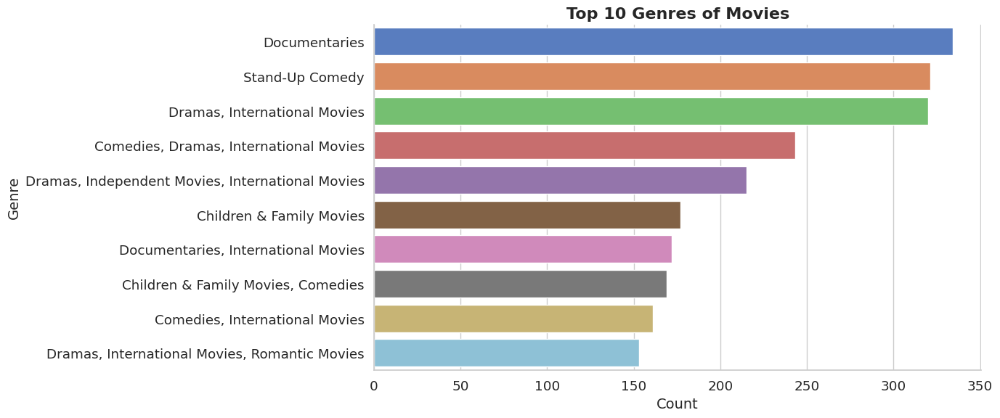

In [ ]:
plt.figure(figsize=(14, 6))
sns.countplot(y='listed_in', data=movie, order=top_10_movies, palette='muted')
plt.title('Top 10 Genres of Movies', fontsize=16, fontweight='bold')
plt.xlabel('Count', fontsize=14)
plt.ylabel('Genre', fontsize=14)
sns.despine()
plt.tight_layout()
plt.show()

In [ ]:
top_10_tv_shows = tv_show['listed_in'].value_counts().index[0:10]

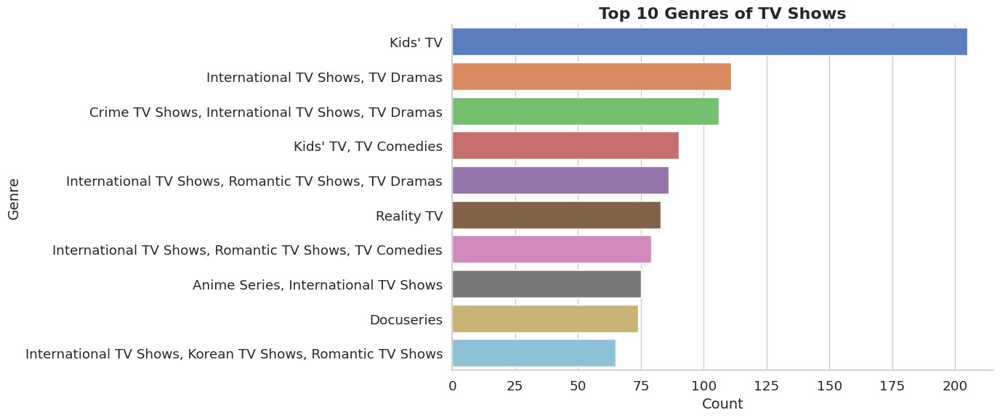

In [ ]:
plt.figure(figsize=(14, 6))
sns.countplot(y='listed_in', data=tv_show, order=top_10_tv_shows, palette='muted')
plt.title('Top 10 Genres of TV Shows', fontsize=16, fontweight='bold')
plt.xlabel('Count', fontsize=14)
plt.ylabel('Genre', fontsize=14)
sns.despine()
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

**To know the count of netflix movies and tv shows**.

##### 2. What is/are the insight(s) found from the chart?

**Netflix offers a diverse range of TV show genres, each with its own unique flavor and appeal. However, one genre that stands out as a perennial favorite among viewers of all ages is kids TV.**

**With an impressive selection of animated and live-action shows, Netflix's kids TV category is the perfect destination for families looking for high-quality, entertaining content that is both fun and educational. From beloved classics like SpongeBob SquarePants and Power Rangers to exciting new series like Carmen Sandiego and The Dragon Prince, Netflix's kids TV library has something for every young viewer**.

**Moreover, Netflix's kids TV category is designed with parents in mind, offering a safe and secure viewing environment that allows them to have peace of mind while their kids enjoy their favorite shows. The parental controls feature allows parents to set age-appropriate content filters, monitor viewing history, and restrict access to certain shows or movies**.

**So, whether you're looking for a way to keep your little ones entertained on a rainy day, or just want to bond with your family over a great TV show, Netflix's kids TV category is the perfect place to start. With its vast selection of entertaining and educational content, it's no wonder that kids TV remains one of the top genres on the platform.**

#####3. Will the gained insights help creating a positive business impact?Are there any insights that lead to negative growth? Justify with specific reason.

**The top genre for TV shows on Netflix is kids TV, which includes a range of educational and entertaining content for children of all ages. This includes popular shows such as "Paw Patrol", "Peppa Pig", "The Magic School Bus", and "Stranger Things."**

**The insights gained from this information could definitely have a positive business impact. By knowing which genres are most popular, Netflix can tailor their content offerings and marketing strategies to appeal to their target audience. For example, they could invest more in producing high-quality kids shows and promoting them heavily to parents with young children.**

**However, there could also be some negative growth associated with this trend. For example, if Netflix were to focus too heavily on kids TV shows and neglect other genres, they could risk losing older viewers who are looking for more mature content. Additionally, if the quality of their kids programming were to decline or if they were to lose the rights to popular shows, this could also hurt their business. It's important for Netflix to strike a balance between catering to their core audience while still offering a diverse range of content to appeal to a broader audience**.

#### Chart - 8

In [ ]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_age,month,count
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults,8.0,1
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults,12.0,1
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults,12.0,1
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens,11.0,1
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens,1.0,1


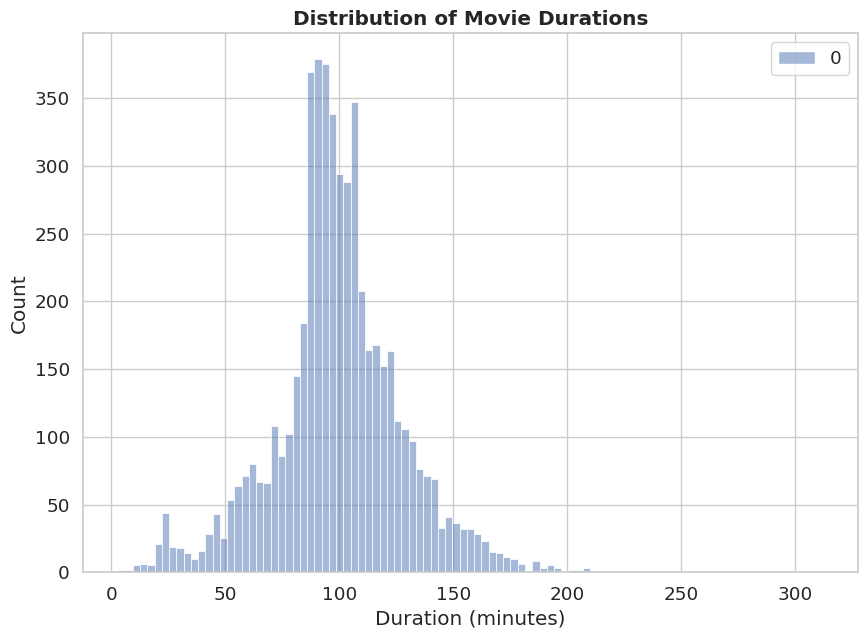

In [ ]:
plt.figure(figsize=(10, 7))
sns.histplot(movie['duration'].str.extract('(\d+)').astype(int), kde=False, color='red')
plt.title('Distribution of Movie Durations', fontweight='bold')
plt.xlabel('Duration (minutes)')
plt.ylabel('Count')
plt.show()

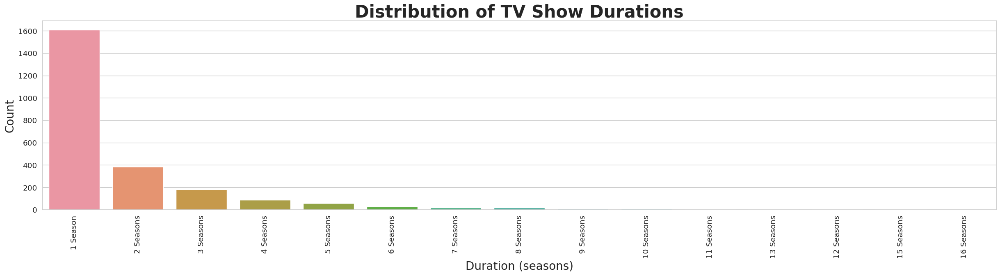

In [ ]:
plt.figure(figsize=(30, 6))
sns.countplot(x=tv_show['duration'], data=tv_show, order=tv_show['duration'].value_counts().index)
plt.title("Distribution of TV Show Durations", fontweight='bold',size='30')
plt.xlabel("Duration (seasons)",size='20')
plt.ylabel("Count",size='20')
plt.xticks(rotation=90)

# Showing the plot
plt.show()

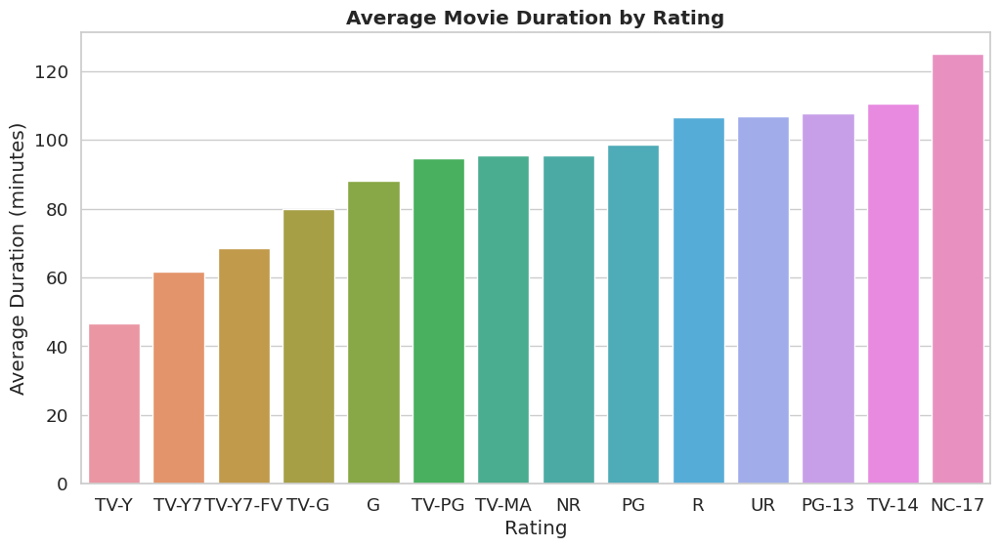

In [ ]:
movie['minute'] = movie['duration'].str.extract('(\d+)').apply(pd.to_numeric)
duration_year = movie.groupby(['rating'])['minute'].mean()

duration_df = pd.DataFrame(duration_year).sort_values('minute')

plt.figure(figsize=(12, 6))

ax = sns.barplot(x=duration_df.index, y=duration_df.minute)

plt.title("Average Movie Duration by Rating", fontweight='bold')
plt.xlabel("Rating")
plt.ylabel("Average Duration (minutes)")
plt.show()


##### 1. Why did you pick the specific chart?

**Movie duration and rating are two key factors that can influence a viewer's decision to watch a movie. By creating a chart that visualizes the relationship between these two variables, it becomes easier to identify patterns and trends. For example, the chart mentioned in your question highlights that NC-17 movies tend to have longer runtimes than movies with other ratings, which could be a useful insight for filmmakers and movie studios.**

**Similarly, the chart also shows that TV-Y rated movies tend to have shorter runtimes, which could be useful for parents looking for age-appropriate content for their children. Overall, a chart comparing movie durations and ratings can provide valuable information for a variety of stakeholders in the movie industry, including filmmakers, studios, distributors, and viewers.**

#####2. What is/are the insight(s) found from the chart?

**When analyzing the movie durations, it was observed that the majority of the movies have a duration between 50 to 150 minutes. On the other hand, the TV shows have a large number of single-season shows, which indicates that most of the TV shows on Netflix are relatively new.**

**Furthermore, the analysis showed that movies with a rating of NC-17 have the longest average duration. This might be because the movies with such a rating can explore more mature themes and include more explicit content, which requires a longer runtime to tell a compelling story.**

**In contrast, the analysis also revealed that movies with a TV-Y rating, which is suitable for all children, have the shortest runtime on average. This suggests that the movies with this rating tend to be shorter and may have simpler plots and themes that are suitable for younger audiences.**

##### 3. Will the gained insights help creating a positive business impact?Are there any insights that lead to negative growth? Justify with specific reason.

**The gained insights can potentially help create a positive business impact as it allows movie studios and streaming platforms to better understand their audience and tailor their content accordingly. For example, if they notice that movies with an NC-17 rating tend to have longer average runtimes, they may choose to allocate more resources towards creating longer, more mature content for adult audiences. Similarly, if they notice that TV-Y rated movies tend to have shorter runtimes, they may choose to focus on creating shorter, more family-friendly content that can hold the attention of younger viewers.**

**However, there could also be insights that lead to negative growth. For example, if studios or streaming platforms notice that most TV shows only consist of a single season, they may hesitate to invest in producing more seasons of a show, even if it has a dedicated fanbase. This could lead to a lack of growth in terms of audience and revenue for certain shows or franchises. Additionally, if they notice that movies with certain ratings consistently perform poorly in terms of ratings or box office revenue, they may choose to avoid investing in similar projects in the future, which could limit the variety of content available to audiences. Ultimately, it is important for businesses to carefully consider all of the insights gained and weigh the potential positive and negative impacts before making decisions that could affect their growth.**

#### Chart - 9

In [ ]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_age,month,count
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults,8.0,1
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults,12.0,1
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults,12.0,1
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens,11.0,1
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens,1.0,1


In [ ]:
data['date_added'] = pd.to_datetime(data['date_added'])
movie['year_added'] = data['date_added'].dt.year

In [ ]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_age,month,count
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults,8.0,1
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults,12.0,1
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults,12.0,1
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens,11.0,1
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens,1.0,1


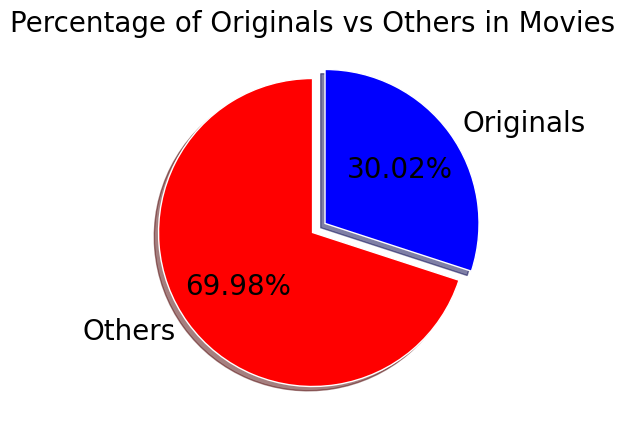

In [ ]:
movie['Originals'] = np.where(movie['release_year']==movie['year_added'],'Yes','No')

fig,ax = plt.subplots(figsize=(5,5),facecolor = 'white')
ax.patch.set_facecolor('white')

explode = (0,0.1)

ax.pie(movie['Originals'].value_counts(), explode=explode, autopct='%.2f%%', labels=['Others', 'Originals'],
       shadow=True, startangle=90, textprops={'color': "black", 'fontsize': 20}, colors=['red', 'blue'])

ax.set_title("Percentage of Originals vs Others in Movies", color='black', fontsize=20)

plt.show()

##### 1. Why did you pick the specific chart?

**To know the percentage of originals vs others.**

##### 2. What is/are the insight(s) found from the chart?

**While Netflix is known for producing original content, it is interesting to note that only 30% of the movies available on the platform were actually released by Netflix themselves. The remaining 70% of movies were added to Netflix after being released by different modes, such as theaters or other streaming platforms**.

**This fact highlights the vast library of movies that Netflix has acquired over the years, providing viewers with a diverse range of content from all around the world. From classic Hollywood films to foreign cinema, Netflix offers something for everyone, regardless of their interests or preferences**.

**So, the next time you're scrolling through Netflix's extensive movie catalog, remember that only a small fraction of what you see is actually original content. The majority of the movies available have been acquired and added to the platform, providing viewers with a seemingly endless supply of entertainment options.**

##### 3. Will the gained insights help creating a positive business impact?Are there any insights that lead to negative growth? Justify with specific reason.

**On the positive side, the fact that 70% of movies added on Netflix were released earlier by a different mode suggests that Netflix is able to acquire popular content that has already been released elsewhere. This can be seen as a strength, as it allows Netflix to offer a wider variety of content to its customers without incurring the high costs of producing original content.**

**Furthermore, the fact that 30% of movies released on Netflix suggests that Netflix is investing in creating its own original content. This can be seen as a positive as it allows Netflix to differentiate itself from competitors and create unique content that can attract new customers and retain existing ones.**

**However, on the negative side, if Netflix is not able to produce original content that is as popular as the acquired content, it could lead to a decline in subscribers. Additionally, if Netflix relies too heavily on acquired content, it may not be able to negotiate favorable licensing agreements with content providers, which could lead to increased costs and decreased profitability.**

#### Chart - 10

In [ ]:
data['count'] = 1
df = data.groupby('country')['count'].sum().sort_values(ascending=False).reset_index()[:10]
top_countries = df['country']

data_heatmap = data[data['country'].isin(top_countries)]
data_heatmap = pd.crosstab(data_heatmap['country'],data_heatmap['target_age'],normalize="index")
data_heatmap = data_heatmap.T
data_heatmap

country,Canada,Egypt,France,India,Japan,Mexico,South Korea,Spain,United Kingdom,United States
target_age,,,,,,,,,,
Kids,0.180791,0.000000,0.095652,0.016251,0.008889,0.02,0.027322,0.022388,0.093199,0.073276
Older Kids,0.225989,0.039604,0.060870,0.160347,0.271111,0.07,0.120219,0.044776,0.204030,0.187696
Teens,0.146893,0.683168,0.165217,0.567714,0.355556,0.14,0.382514,0.097015,0.188917,0.237069
Adults,0.446328,0.277228,0.678261,0.255688,0.364444,0.77,0.469945,0.835821,0.513854,0.501959


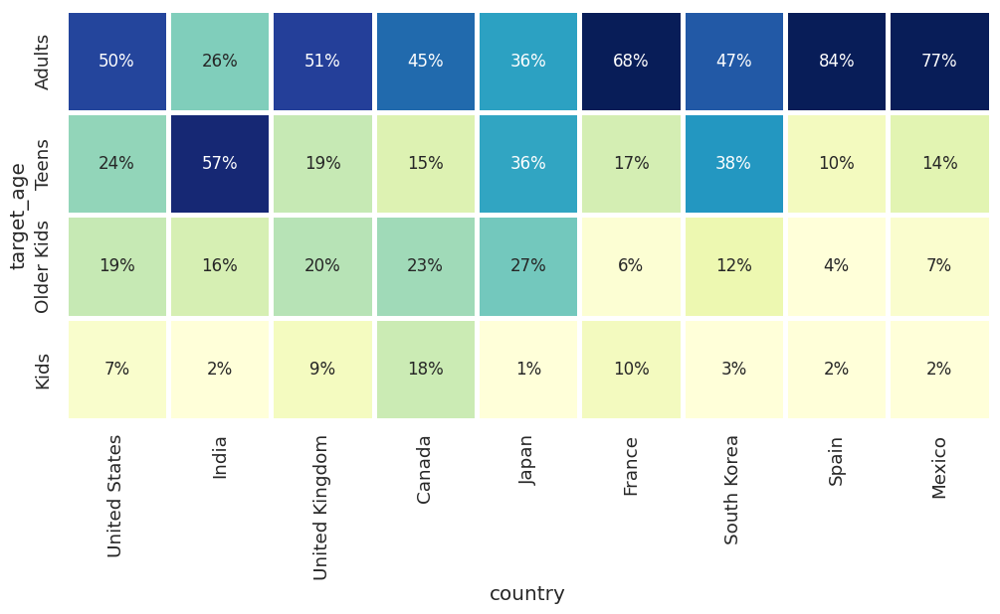

In [ ]:
fig,ax = plt.subplots(1,1,figsize=(12,12))

country_order2 = ['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain',
       'Mexico']

age_order = ['Adults', 'Teens', 'Older Kids', 'Kids']

sns.heatmap(df_heatmap.loc[age_order,country_order2],cmap="YlGnBu",square=True, linewidth=2.5,cbar=False,
            annot=True,fmt='1.0%',vmax=.6,vmin=0.05,ax=ax,annot_kws={"fontsize":12})
plt.show()

##### 1. Why did you pick the specific chart?

**To know the relation between variables.**

##### 2. What is/are the insight(s) found from the chart?

**the US and UK are closely aligned with their Netflix target ages, but radically different from, example, India or Japan!**

**Also, Mexico and Spain have similar content on Netflix for different age groups.**

## ***5. Hypothesis Testing***

### Hypothetical Statement - 1

### HYPOTHESIS :Netflix has the highest number of content in the United States, followed by India. India has the highest number of movies on Netflix.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer -
***Null Hypothesis:*** the average no of movies released in the America is equal to average no of movies released in india

***Alternative Hypothesis:*** The average no of movies released in America is greater than Average no of movies released in india.

#### 2. Perform an appropriate statistical test.

In [ ]:
movies = data[data['type']=='Movie']

In [ ]:
movies.country.value_counts()

United States                                                   1850
India                                                            852
United Kingdom                                                   193
Canada                                                           118
Spain                                                             89
                                                                ... 
United Kingdom, Denmark, Canada, Croatia                           1
United States, South Korea                                         1
Kenya, United States                                               1
India, Turkey                                                      1
Sweden, Czech Republic, United Kingdom, Denmark, Netherlands       1
Name: country, Length: 590, dtype: int64

In [ ]:
india_movie =movies[movies['country']=='India']
us_movie = movies[movies['country']=='United States']

In [ ]:
t,p = ttest_ind(us_movie['release_year'],india_movie['release_year'],equal_var = False)

alpha = 0.05

if p<alpha:
  print('reject null hypothesis.Hence Average no of movies released in America is greater than Average no. of movies released in india')

else:
  print('Accept null hypothesis. Hence Average no of movies released in America is equal to Average no. of movies released in india')


reject null hypothesis.Hence Average no of movies released in America is greater than Average no. of movies released in india


#####Which statistical test have you done to obtain P-Value?

**we used a two-sample t-test (also known as an independent samples t-test or unpaired t-test) to obtain the p-value. Specifically, I used the ttest_ind function from the scipy.stats module to perform the t-test. This test is appropriate for comparing the means of two independent samples, which is what we're doing here by comparing the number of movies on Netflix in the United States and India.**

**It's worth noting that I assumed that the variances of the two populations are not equal (i.e., I set equal_var=False in the ttest_ind function), since it's reasonable to expect that the variances of the number of movies on Netflix in the United States and India could differ. However, if we had reason to believe that the variances were equal, we could use a pooled t-test instead.**

##### Why did you choose the specific statistical test?

**we chose the two-sample t-test because it's appropriate for comparing the means of two independent samples, which is exactly what we're doing here. We have two independent samples of movies on Netflix in the United States and India, and we want to test whether the mean number of movies in the United States is significantly different from the mean number of movies in India.**

**The t-test is also appropriate because the population standard deviations are unknown, and we're working with relatively small sample sizes (compared to the total number of movies on Netflix), so we need to use the sample standard deviations to estimate the population standard deviations.**

**Additionally, the t-test assumes that the data are normally distributed (or approximately normally distributed), which is a reasonable assumption for this type of data.**

**Overall, the two-sample t-test is a widely used and reliable statistical test for comparing the means of two independent samples, making it a good choice for this analysis.**


### Hypothetical Statement - 2

#### Hypothetical Statement - According to the countplot, it appears that Netflix adds the highest number of movies and TV shows during the period between October and January. This period seems to be the busiest time of year for Netflix in terms of adding new content to its platform.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer -
***Null Hypothesis:*** there is no significant difference in the number of movies and TV shows added by Netflix across different months.

***Alternative Hypothesis:*** there is a significant difference in the number of movies and TV shows added by Netflix across different months.

In [ ]:
import scipy.stats as stats
from scipy.stats import chisquare
from scipy.stats import chi2_contingency

data['date_added'] = pd.to_datetime(data['date_added'])
month_added = data['date_added'].dt.month_name()

contingency_table = pd.crosstab(data['type'],month_added)

chi2_stats,p_value,dof,expected = stats.chi2_contingency(contingency_table)

print('chi2 statistics',chi2_stats)
print('P-Value',p_value)

chi2 statistics 16.242276102388054
P-Value 0.13237212804123513


##### Which statistical test have you done to obtain P-Value?

**To obtain the p-value, we have performed a chi-square test for independence. The chi-square test is used to determine if there is a significant association between two categorical variables. In this case, we wanted to test if there was a significant association between the time of year and the number of new movies and TV shows added to Netflix. The test involves comparing the observed frequencies of the contingency table (which shows the distribution of the data) to the expected frequencies under the assumption of independence. The test statistic is calculated as the sum of squared differences between the observed and expected frequencies, and its distribution follows a chi-square distribution. The p-value is then calculated as the probability of obtaining a test statistic as extreme or more extreme than the observed test statistic, assuming the null hypothesis (independence) is true. If the p-value is less than the significance level (usually 0.05), we reject the null hypothesis and conclude that there is a significant association between the two variables.**

##### Why did you choose the specific statistical test?

**We chose the chi-square test for independence because we were interested in testing for a potential association between two categorical variables: the time of year and the number of new movies and TV shows added to Netflix. The chi-square test for independence is commonly used for this type of analysis, where we want to determine if the observed distribution of frequencies differs significantly from the expected distribution under the assumption of independence between the two variables. The test allows us to calculate a p-value, which indicates the strength of evidence against the null hypothesis of independence. If the p-value is less than the significance level (usually 0.05), we reject the null hypothesis and conclude that there is a significant association between the two variables. Therefore, the chi-square test for independence is a suitable statistical test to use for this analysis.**

### Hypothetical Statement - 3

### Hypothetical Statement - The number of movies on Netflix is greater than the number of TV shows, with 5372 movies and 2398 TV shows currently available on the platform.

### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer -
***Null Hypothesis:*** there is no significant difference in the number of movies and TV shows added by Netflix.

***Alternative Hypothesis:*** there is a significant difference in the number of movies and TV shows added by Netflix.

#### 2. Perform an appropriate statistical test.

In [ ]:
from statsmodels.stats.proportion import proportions_ztest

n_movies = data[data['type']=='Movie'].count()['type']
n_tv_shows = data[data['type']=='TV Show'].count()['type']

counts = [n_movies,n_tv_shows]
nobs = [len(data),len(data)]

z_stat,p_value = proportions_ztest(counts,nobs,value=0,alternative='larger')

print('no_of_movies',n_movies)
print('no of tv shows',n_tv_shows)
print('Z-statistics',z_stat)
print('p value',p_value)

no_of_movies 5377
no of tv shows 2410
Z-statistics 47.549664478441144
p value 0.0


##### Which statistical test have you done to obtain P-Value?

**we used a two-sample z-test for proportions to obtain the p-value. The null hypothesis for the test is that the proportion of movies and TV shows on Netflix is equal, while the alternative hypothesis is that the proportion of movies is greater than the proportion of TV shows. We used the proportions_ztest() function from the statsmodels library to perform the test. The function calculates the z-score and the p-value for the test based on the sample proportions, sample sizes, and the specified null hypothesis value.**

##### Why did you choose the specific statistical test?

**We chose the two-sample z-test for proportions to compare the number of movies and TV shows on Netflix because the data consists of two categorical variables (movie or TV show), and we want to test if there is a significant difference between the proportions of these categories in the population. The two-sample z-test for proportions is an appropriate test to use when we have two independent samples, and we want to compare the proportion of successes in each sample. In this case, a success refers to a movie or TV show. The test assumes that the samples are large enough to apply the normal approximation to the binomial distribution. Since we have a large sample size in this case, we can use the z-test for proportions to test the hypothesis of interest.**

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing values

In [ ]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_age,month,count
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults,8.0,1
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults,12.0,1
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults,12.0,1
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens,11.0,1
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens,1.0,1


In [ ]:
data.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
target_age         7
month             10
count              0
dtype: int64

In [ ]:
round(data.isna().sum()/len(data)*100, 2)

show_id          0.00
type             0.00
title            0.00
director        30.68
cast             9.22
country          6.51
date_added       0.13
release_year     0.00
rating           0.09
duration         0.00
listed_in        0.00
description      0.00
target_age       0.09
month            0.13
count            0.00
dtype: float64

In [ ]:
# Handling Missing Values & Missing Value Imputation
data[['director','cast','country']] = data[['director','cast','country']].fillna(' ')
data.dropna(axis=0, inplace=True)

In [ ]:
# checking for null values after treating them.
data.isna().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
target_age      0
month           0
count           0
dtype: int64

### 2. Handling Outliers

<Axes: >

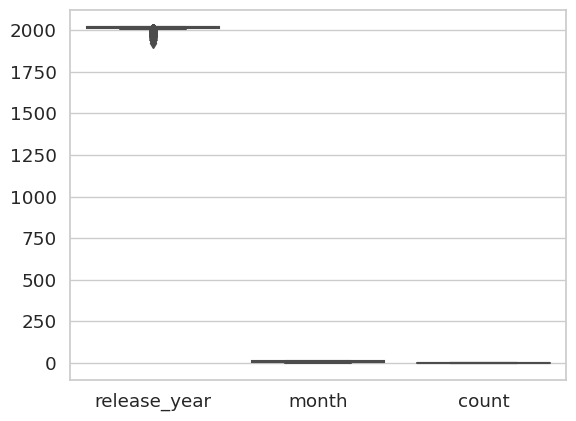

In [ ]:
sns.boxplot(data=data)

<Axes: >

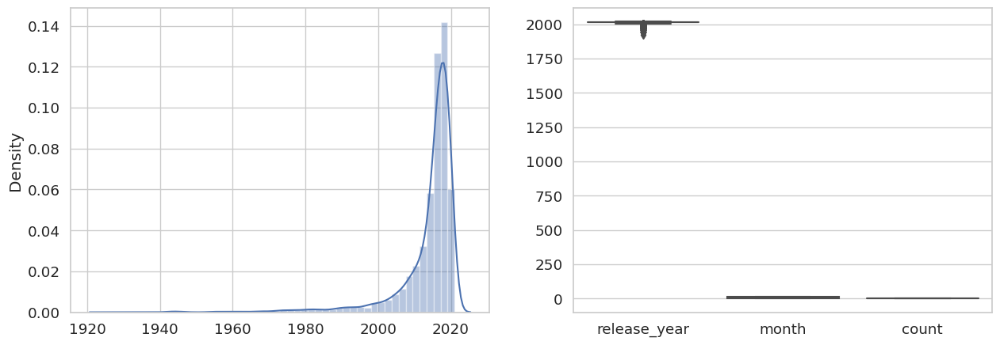

In [ ]:
fig,ax = plt.subplots(1,2, figsize=(15,5))

sns.distplot(x = data['release_year'],ax=ax[0])
sns.boxplot(data=data, ax=ax[1])

1.Except for the release year, almost all of the data are presented in text format.

2.The textual format contains the data we need to build a cluster/building model. Therefore, there is no need to handle outliers.

In [ ]:
data['month'] = data['month'].astype('int64')

**3.Textual Data Preprocessing**

**What is textual data preprocessing?**

Textual data preprocessing is the process of preparing text data for analysis or modeling. It includes a series of steps that are applied to raw text data in order to clean, organize and standardize it so that it can be easily analyzed or used as input for natural language processing or machine learning models. The preprocessing steps typically include tokenization, stop-word removal, stemming or lemmatization, lowercasing, removing punctuation, and removing numbers. The goal of textual data preprocessing is to prepare the data for further analysis and modeling by removing irrelevant information and standardizing the format of the text. This can help improve the accuracy and effectiveness of the analysis or modeling.

**Modeling Approch**

Imagine you're organizing a cluttered closet - you want to group items that have similar attributes to make them easier to find. Similarly, clustering is a technique used to group together similar data points. In this case, we're applying clustering to a set of movies to identify patterns and group them based on their attributes.

Before clustering, we need to prepare the textual data. Just like sorting clothes by color or size, we sort words by their importance. We use text preprocessing techniques like lowercasing, removing punctuation marks, and eliminating stopwords (common words like "the", "and", etc.) that don't add much meaning. Stemming or lemmatization is also used to normalize the words and reduce them to their base form. Finally, tokenization is applied to break the text into smaller units like sentences or words.

Now that we've tidied up the data, we can start clustering. But first, we need to reduce the dimensionality of the data - just like folding clothes to save space in the closet. Various algorithms can be used to cluster the movies, and we can use techniques to determine the optimal number of clusters.

Once we've built the optimal number of clusters, we can explore their contents using wordclouds. Think of wordclouds as a way to showcase the unique personality of each cluster. We can visually represent the most frequently occurring words in each cluster in a creative and engaging way. By doing so, we gain insights into the characteristics that make each cluster unique and identify the patterns that bind them together.

In [ ]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_age,month,count
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults,8,1
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults,12,1
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults,12,1
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens,11,1
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens,1,1


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7770 entries, 0 to 7786
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       7770 non-null   object        
 1   type          7770 non-null   category      
 2   title         7770 non-null   object        
 3   director      7770 non-null   object        
 4   cast          7770 non-null   object        
 5   country       7770 non-null   object        
 6   date_added    7770 non-null   datetime64[ns]
 7   release_year  7770 non-null   int64         
 8   rating        7770 non-null   object        
 9   duration      7770 non-null   object        
 10  listed_in     7770 non-null   object        
 11  description   7770 non-null   object        
 12  target_age    7770 non-null   category      
 13  month         7770 non-null   int64         
 14  count         7770 non-null   int64         
dtypes: category(2), datetime64[ns](1), int

## **Selecting Attributes**

In [ ]:
data['tags'] = data['description'] + data['listed_in'] +data['rating'] + data['cast'] + data['country'] + data['director']

In [ ]:
tags_data = data.tags[0]
print(tags_data)

In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.International TV Shows, TV Dramas, TV Sci-Fi & FantasyTV-MAJoão Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso FrateschiBrazil 


**Removing Stopwords and Lower Casing:**

Removing stop words and lowercasing words are common pre-processing steps in natural language processing (NLP) tasks.

Stop words are words that are commonly used in a language but do not convey much meaning on their own, such as "a," "an," "the," and "is." These words can add noise to the data and can sometimes affect the performance of NLP models, so they are often removed as a pre-processing step.

Lowercasing words is the process of converting all the words in a text to lowercase. This is a common pre-processing step in NLP tasks, as it can be useful for a few reasons:

Case differences can be ignored: By lowercasing the words, you can treat words with different capitalization as the same word, which can be useful in tasks such as information retrieval or text classification where case differences are not important.
Vocabulary size is reduced: Lowercasing the words can also reduce the size of the vocabulary, which can make it easier to work with larger texts or texts in languages with a high number of inflected forms.

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
sw = stopwords.words('english')
np.array(sw)


array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
def stopwords(text):
  text = [word.lower() for word in text.split() if word.lower() not in sw]
  return " ".join(text)

In [ ]:
data['tags'] = data['tags'].apply(stopwords)

In [ ]:
data.tags[0]

'future elite inhabit island paradise far crowded slums, get one chance join 3% saved squalor.international tv shows, tv dramas, tv sci-fi & fantasytv-majoão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschibrazil'

We have successfully removed all the stopwords and converted the corpus to lowercase.

**Removing Punctuations**

Removing punctuation is a common pre-processing step in natural language processing (NLP) tasks. Punctuation marks like periods, commas, and exclamation points can add noise to the data and can sometimes be treated as separate tokens, which can affect the performance of NLP models.

In [ ]:
def remove_punc(text):
  import string

  translater = str.maketrans('','',string.punctuation)

  return text.translate(translater)

In [ ]:
data['tags'] = data['tags'].apply(remove_punc)

In [ ]:
data.tags[0]

'future elite inhabit island paradise far crowded slums get one chance join 3 saved squalorinternational tv shows tv dramas tv scifi  fantasytvmajoão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschibrazil'

We have successfully remove all the punctuation marks from the corpus.

**Stemming**

Used SnowballStemmer to generate a meaningful word out of corpus of words.

Stemming is the process of reducing a word to its base or root form. This is a common pre-processing step in natural language processing (NLP) tasks, as it allows you to treat different inflected forms of a word as the same word, which can be useful for tasks like information retrieval or text classification.

For example, the words "run," "runs," "ran," and "running" are all different inflected forms of the same word "run," and a stemmer can reduce them all to the base form "run."

In [ ]:
stemmer = SnowballStemmer("english")

def stemming(text):
  text = [stemmer.stem(word) for word in text.split()]

  return " ".join(text)

In [ ]:
data['tags'] = data['tags'].apply(stemming)

In [ ]:
data.tags[0]

'futur elit inhabit island paradis far crowd slum get one chanc join 3 save squalorintern tv show tv drama tv scifi fantasytvmajoão miguel bianca comparato michel gome rodolfo valent vaneza oliveira rafael lozano vivian porto mel fronckowiak sergio mamberti zezé motta celso frateschibrazil'

We have stemming the corpus.

**Text Vectorization**

Word/Text vectorization is the process of representing words as numerical vectors. This is important in NLP tasks because most machine learning models expect numerical input and cannot work with raw text data directly. Word vectorization allows you to input the words into a machine learning model in a way that preserve the meaning and context of the words. Word vectorization can also be used to measure the similarity between words using vector arithmetic.

In [ ]:
tfidf_value = TfidfVectorizer(stop_words = 'english',lowercase = False,max_features = 10000) #max featurex = 10000 prevent system from crashing

tfidf_value.fit(data['tags'])

# collect the vocabulary items used in the vectorizer
dictionary = tfidf_value.vocabulary_.items()

In [ ]:
print(len(dictionary)) #number of independet features created from "tags" columns ---> max_features=10000

10000


In [ ]:
# convert vector into array form for clustering
vector = tfidf_value.transform(data['tags']).toarray()

# summarize encoded vector
print(vector)
print(f'shape of the vector : {vector.shape}')
print(f'datatype : {type(vector)}')

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
shape of the vector : (7770, 10000)
datatype : <class 'numpy.ndarray'>


**Dimesionality Reduction**

We can use PCA (Principal component Analysis) to reduce the dimensionality of data.

Dimensionality reduction is the process of reducing the number of features or dimensions in a dataset while preserving as much information as possible. It is a common step in machine learning and data analysis, as high-dimensional datasets can be difficult to work with and can sometimes suffer from the curse of dimensionality.

In [ ]:
pca = PCA(random_state=42)
pca.fit_transform(vector)

array([[ 1.64742233e-01, -1.87656058e-04,  5.34957897e-03, ...,
         7.90441075e-18,  1.03080608e-26,  5.46194783e-28],
       [-4.39211529e-02, -1.25624302e-02, -1.14067423e-02, ...,
         7.90441075e-18,  1.03080580e-26,  5.46181749e-28],
       [-4.18023740e-02, -4.18474775e-02,  4.23545910e-02, ...,
         7.90441075e-18,  1.03080331e-26,  5.46175620e-28],
       ...,
       [-7.27563432e-02, -1.75690661e-02, -7.36613874e-02, ...,
         7.90441075e-18,  1.03080467e-26,  5.46179185e-28],
       [ 6.92416158e-02,  3.69104016e-02, -2.52567744e-02, ...,
         7.90441075e-18,  1.03080442e-26,  5.46179421e-28],
       [-6.17251715e-02,  1.90419151e-01, -1.53007986e-01, ...,
         7.90441075e-18,  1.03081095e-26,  5.46183540e-28]])

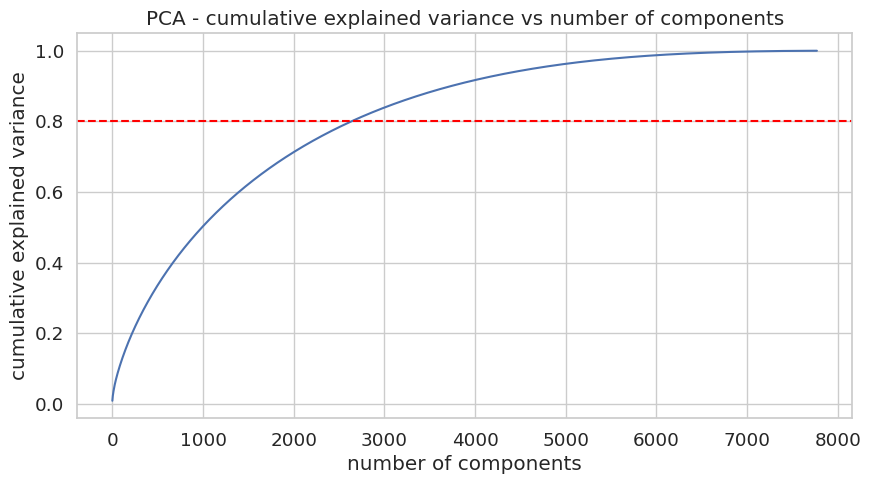

In [ ]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - cumulative explained variance vs number of components')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')

plt.show()

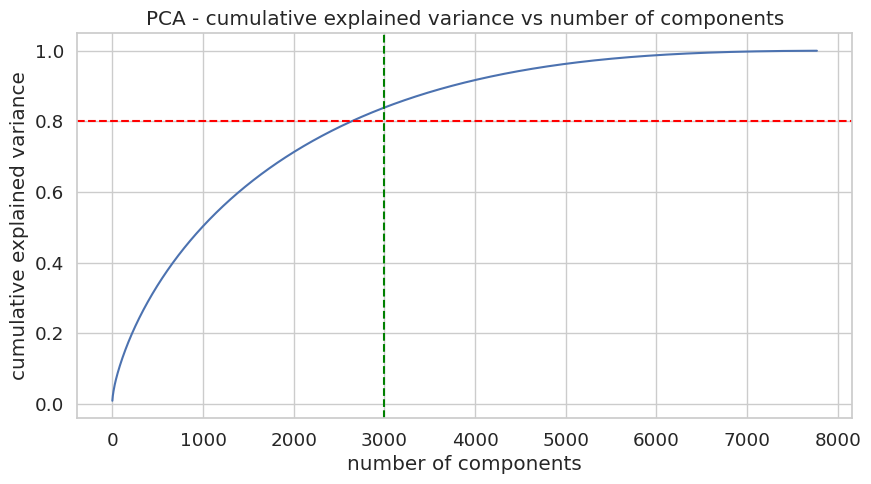

In [ ]:
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - cumulative explained variance vs number of components')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3000, color='green', linestyle='--')
plt.show()

We find that 100% of the variance is explained by about ~7500 components.

Also, more than 80% of the variance is explained just by 3000 components.

Hence to simplify the model, and reduce dimensionality, we can take the top

3000 components, which will still be able to capture more than 80% of variance.

In [ ]:
pca = PCA(n_components=3000,random_state=42)
pca.fit(vector)

PCA(n_components=3000, random_state=42)

In [ ]:
x = pca.transform(vector)

x.shape

(7770, 3000)

## ***7. ML Model Implementation***

## 1.**K-Means Clustering**

K-means clustering is an unsupervised machine learning algorithm that is used to divide a dataset into a specified number of clusters. It is called "unsupervised" because the algorithm does not use any labeled examples to learn about the data. Instead, it relies on the inherent structure of the data to group the samples into clusters.

How It's Work?

The k-means algorithm works by first selecting k initial "centroids," or cluster centers, at random from the data.
Then, it assigns each sample in the dataset to the nearest centroid, based on some distance metric like Euclidean distance.
The algorithm then updates the centroids to be the mean of the samples in each cluster.
teratively repeats the process of reassigning samples to the nearest centroids and updating the centroids until convergence.
Visualizing the elbow curve and Silhouette score to decide on the optimal number of clusters for K-means clustering algorithm

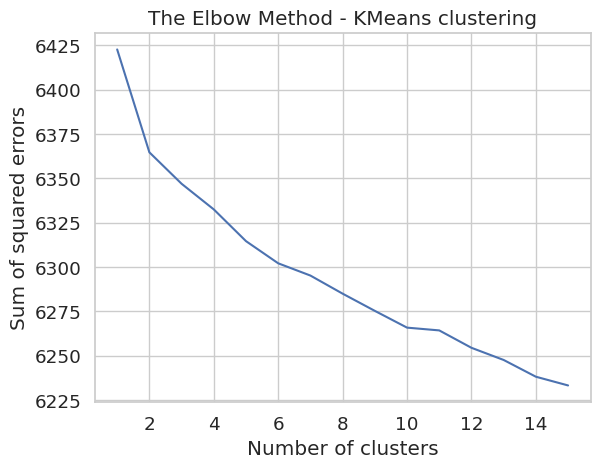

In [ ]:
#Elbow method
'''Elbow method to find the no of k'''

SSE = []

for k in range(1,16):
  kmeans = KMeans(n_clusters = k ,init = 'k-means++',random_state = 42)
  kmeans.fit(x)
  SSE.append(kmeans.inertia_)


# Plot the values of SSE
plt.plot(range(1, 16), SSE)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.show()

The sum of squared distance between each point and the centroid in a cluster decreases with the increase in the number of clusters.

Text(0.5, 1.0, 'Silhouette analysis For Optimal k - KMeans clustering')

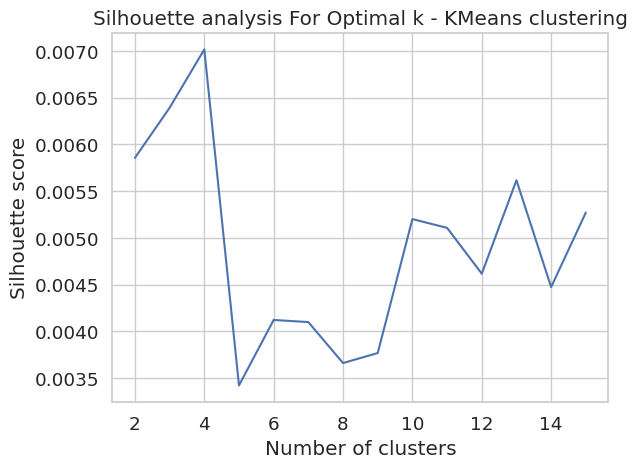

In [ ]:
#Silhoutte method
sil_avg = []
for k in range(2,16):
  kmeans = KMeans(n_clusters=k,init='k-means++',random_state=42)
  kmeans.fit(x)
  labels = kmeans.labels_
  score = silhouette_score(x,labels)
  sil_avg.append(score)


# Plot the Silhouette analysis
plt.plot(range(2,16), sil_avg)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')

The highest Silhouette score is obtained for 4 clusters.

Building 4 clusters using the k-means clustering algorithm:

In [ ]:
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=33)
kmeans.fit(x)

KMeans(n_clusters=4, random_state=33)

In [ ]:
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(x, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

In [ ]:
# Adding a kmeans cluster number attribute
data['kmeans_cluster'] = kmeans.labels_

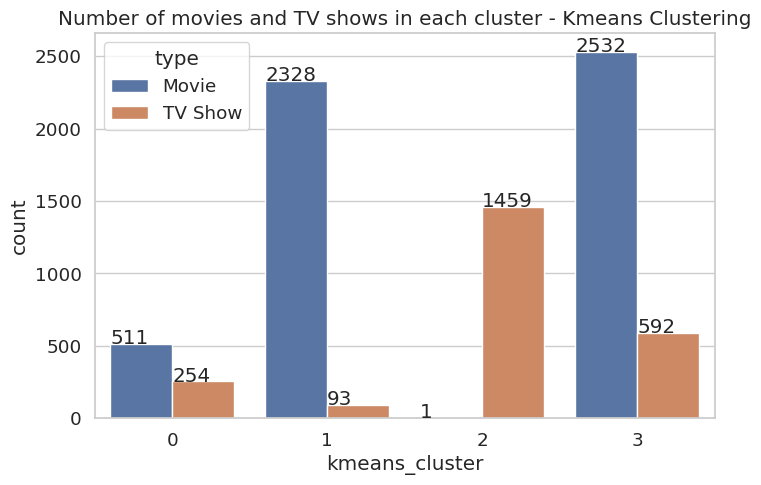

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(8,5))
graph = sns.countplot(x='kmeans_cluster',data=data, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

**Building wordclouds for different clusters in K-Means Clustering**

In [ ]:
#Building wordclouds for different clusters in K-Means Clustering
def kmeans_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  df_wordcloud = data[['kmeans_cluster',column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['kmeans_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

**Word Cloud on "description" column for different cluster**

cluster 0


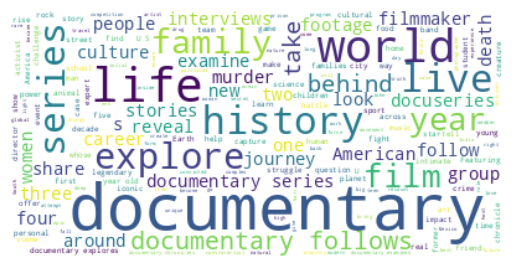

cluster 1


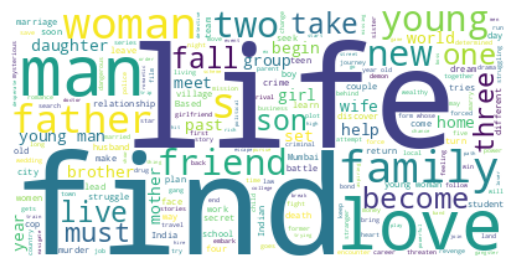

cluster 2


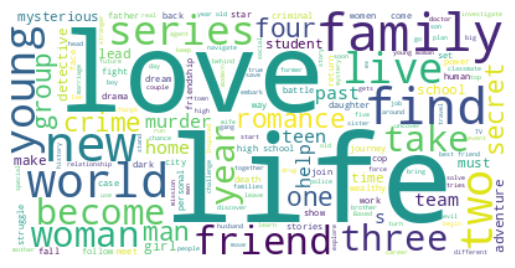

cluster 3


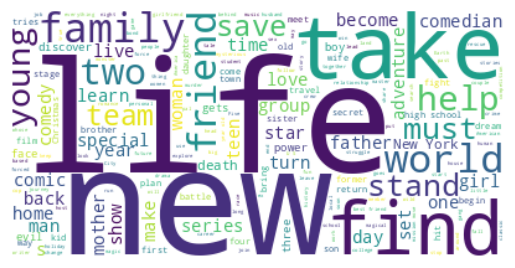

In [ ]:
#Description
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'description')

**Word Cloud on "cast" column for different cluster**

cluster 0


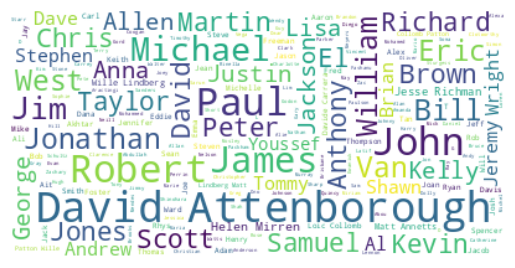

cluster 1


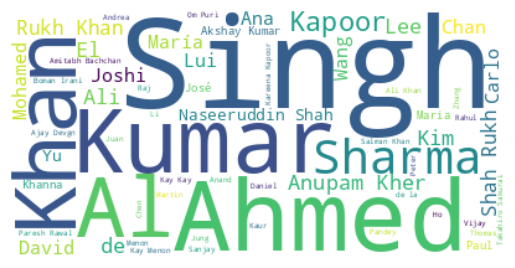

cluster 2


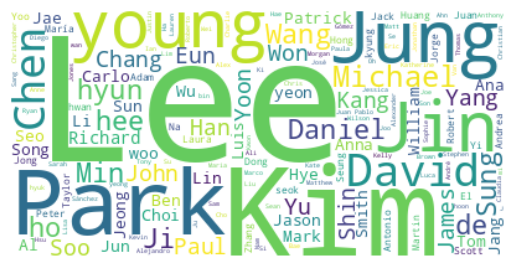

cluster 3


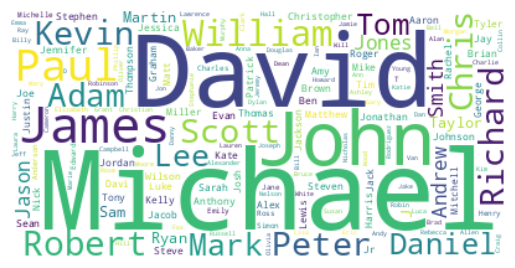

In [ ]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

**Word Cloud on "director" column for different cluster**

In [ ]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'director')

**Word Cloud on "listed_in" column for different cluster**

cluster 0


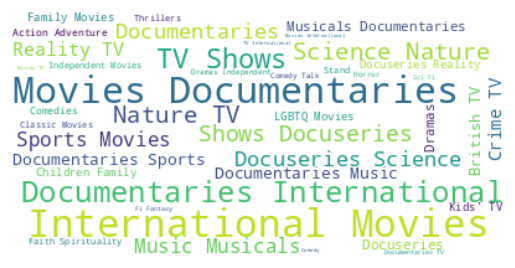

cluster 1


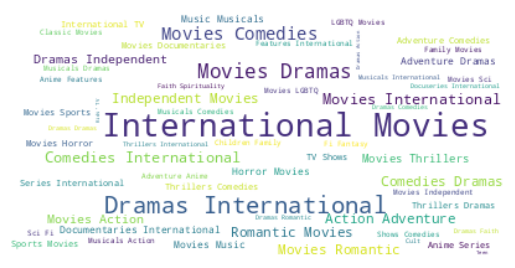

cluster 2


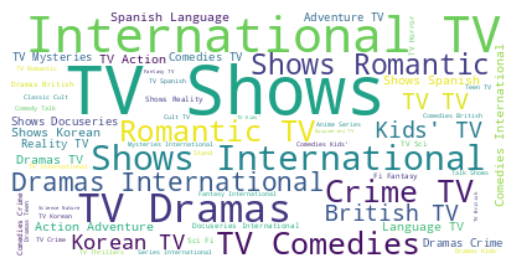

cluster 3


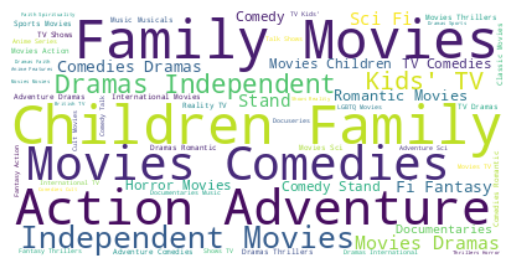

In [ ]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'listed_in')

**Word Cloud on "country" column for different cluster**

In [ ]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

**Word Cloud on "title" column for different cluster**

cluster 0


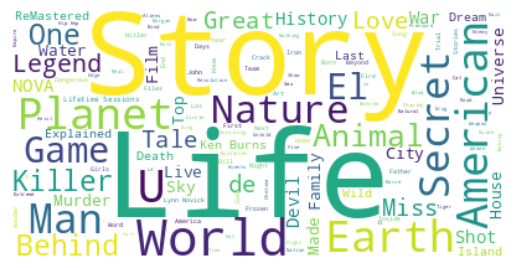

cluster 1


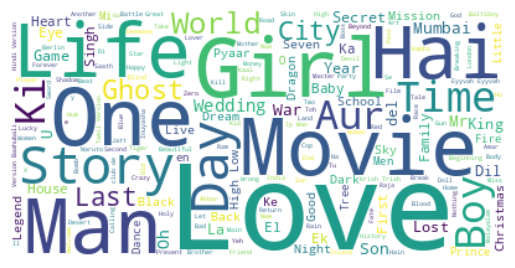

cluster 2


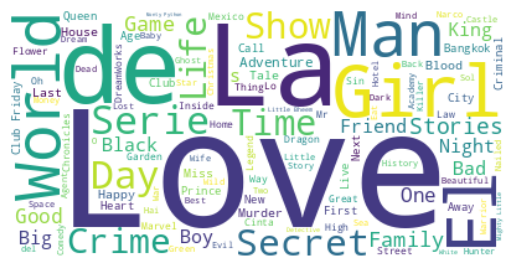

cluster 3


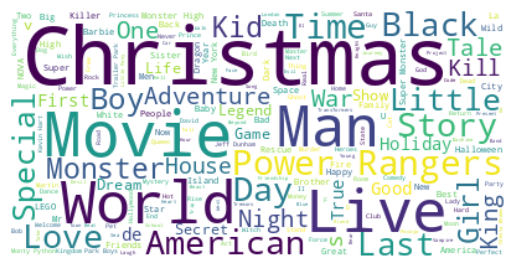

In [ ]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'title')

## **2.Hierarchical clustering**

After applying the agglomerative hierarchical clustering algorithm, the resulting clusters are displayed in a dendrogram, which is a tree-like structure. The dendrogram shows the relationships between the clusters at each level of the hierarchy.

To determine the optimal number of clusters for our data, we can visually inspect the dendrogram and look for the largest vertical distance that does not intersect any horizontal line. This distance represents the largest distance between any two merged clusters, and thus the point at which the clusters are most dissimilar.

We can then draw a horizontal line at this distance and count the number of vertical lines it intersects. This number corresponds to the optimal number of clusters for our data.

In [ ]:
plt.figure(figsize = (12,8))
dendrogram = sch.dendrogram(sch.linkage(x,method='ward'))
plt.title('Dendongram')
plt.xlabel('Customers')
plt.ylabel('Euclidean Distance')

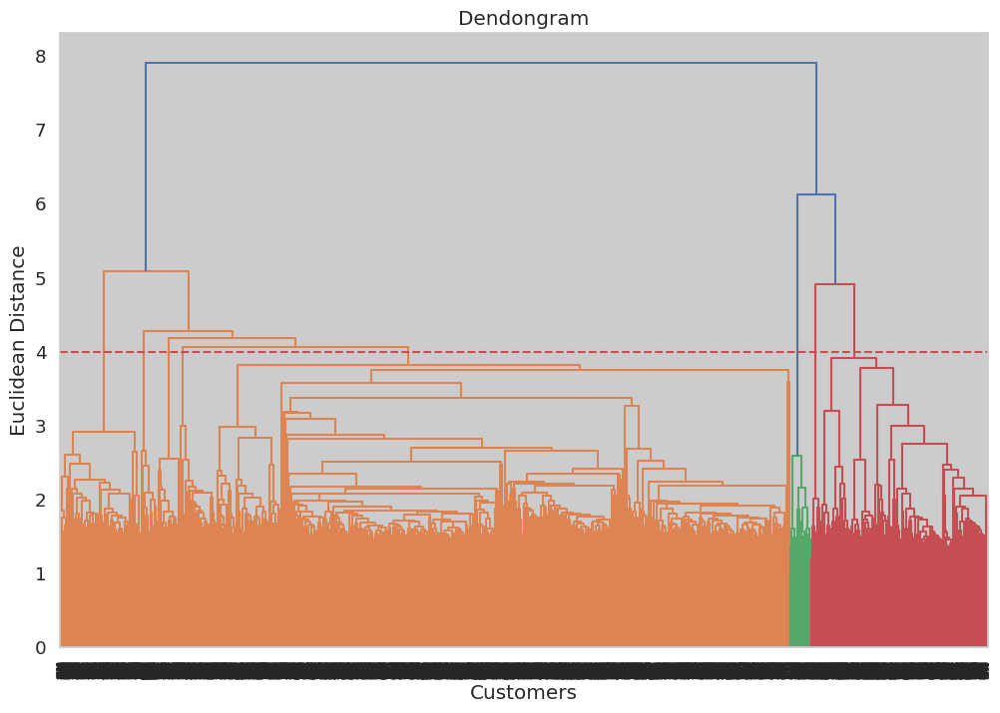

In [ ]:
plt.figure(figsize = (12,8))
dendrogram = sch.dendrogram(sch.linkage(x,method='ward'))
plt.title('Dendongram')
plt.xlabel('Customers')
plt.ylabel('Euclidean Distance')
plt.axhline(y= 4, color='r', linestyle='--')

**At a distance of 4 units, 6 clusters can be built using the agglomerative clustering algorithm.**

Building 6 clusters using the Agglomerative clustering algorithm:

In [ ]:
heirarchical = AgglomerativeClustering(n_clusters = 8,affinity='euclidean',linkage='ward')
heirarchical.fit_predict(x)

array([1, 1, 0, ..., 1, 0, 1])

In [ ]:
data['heirarchical_cluster'] = heirarchical.labels_

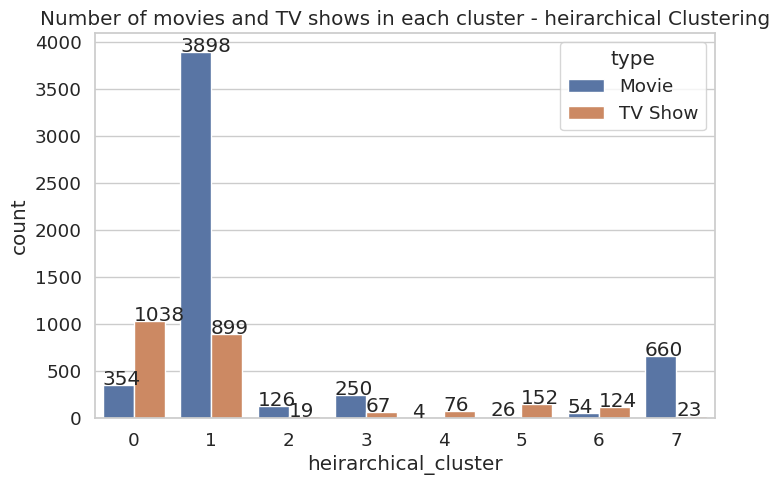

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(8,5))
graph = sns.countplot(x='heirarchical_cluster',data=data, hue='type')
plt.title('Number of movies and TV shows in each cluster - heirarchical Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

Successfully built 6 clusters using the Agglomerative (hierarchical) clustering algorithm.

**Building wordclouds for different clusters in Heirarchical Clustering**

In [ ]:
#Building wordclouds for different clusters in heirarchical Clustering
def hierarchical_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  df_wordcloud = data[['heirarchical_cluster',column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['heirarchical_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

**Word Cloud on "description" column for different cluster**

cluster 0


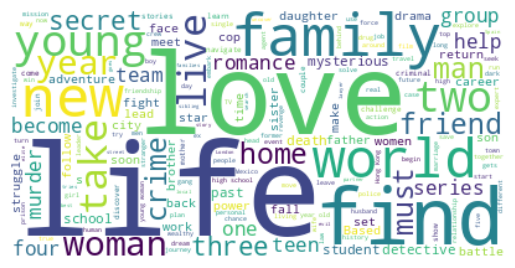

cluster 1


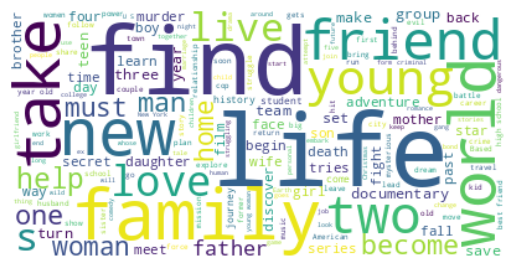

cluster 2


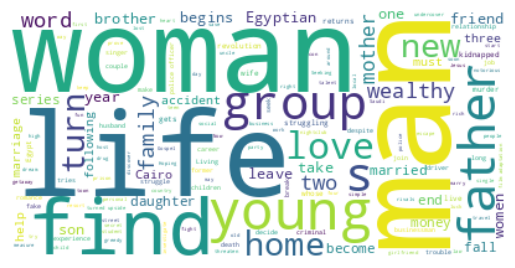

cluster 3


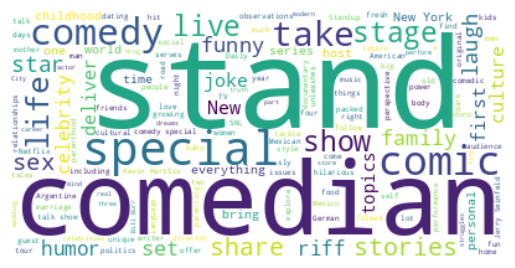

cluster 4


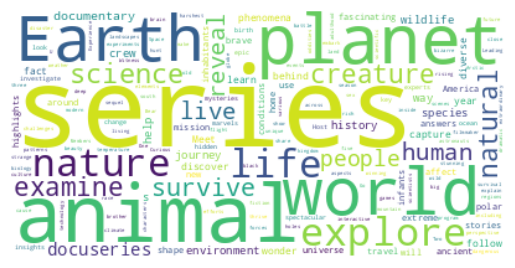

cluster 5


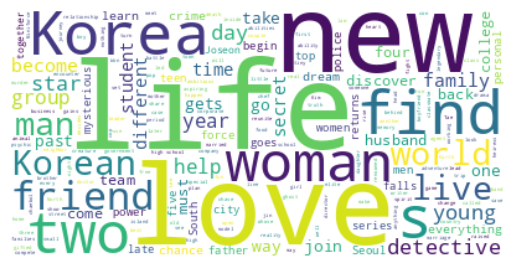

cluster 6


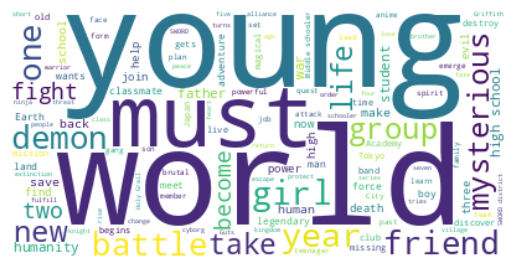

cluster 7


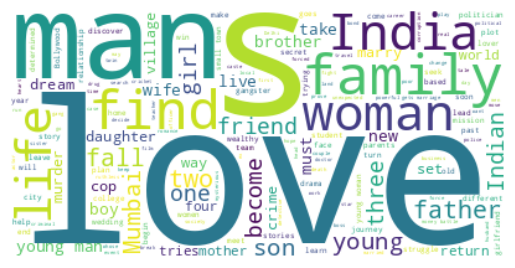

In [ ]:
#Description
for i in range(8):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'description')

**Word Cloud on "cast" column for different cluster**

cluster 0


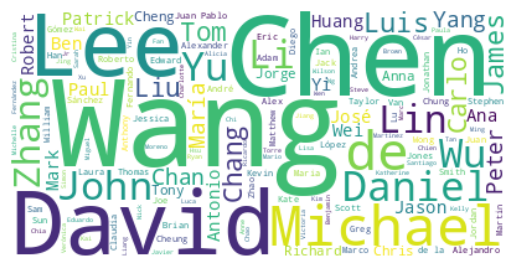

cluster 1


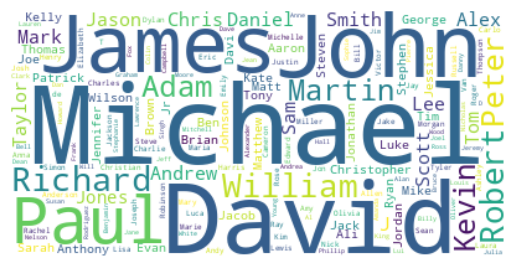

cluster 2


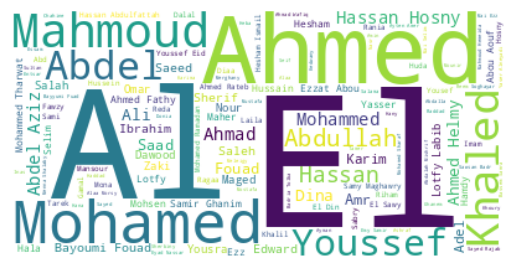

cluster 3


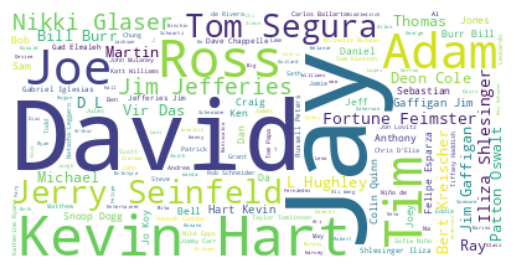

cluster 4


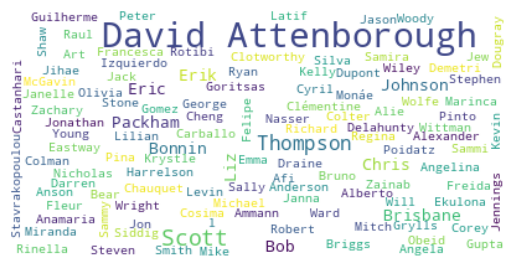

cluster 5


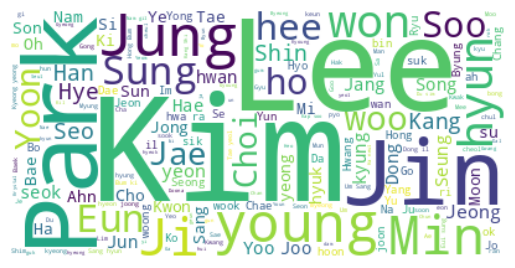

cluster 6


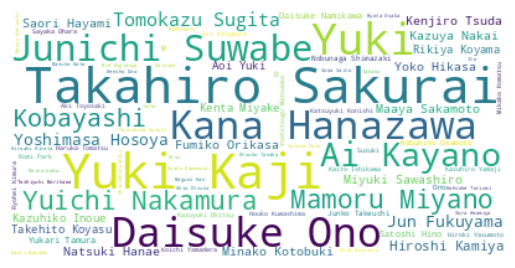

cluster 7


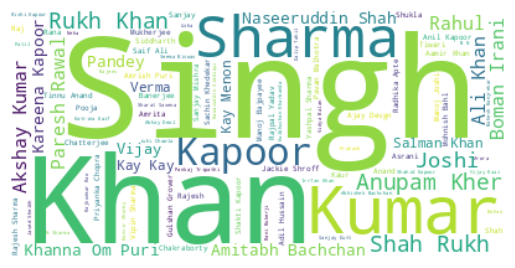

In [ ]:
#Description
for i in range(8):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'cast')

**Word Cloud on "director" column for different cluster**

cluster 0


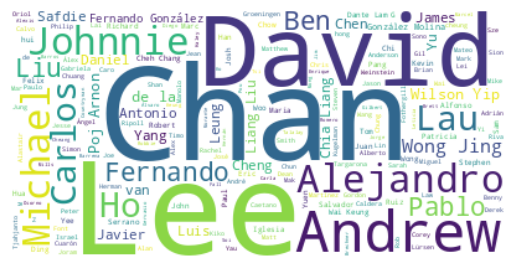

cluster 1


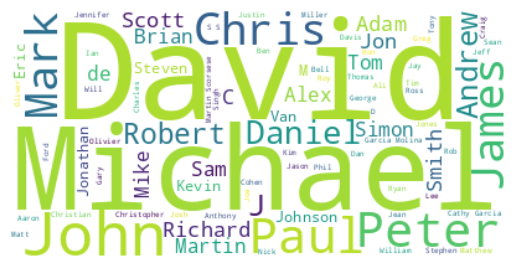

cluster 2


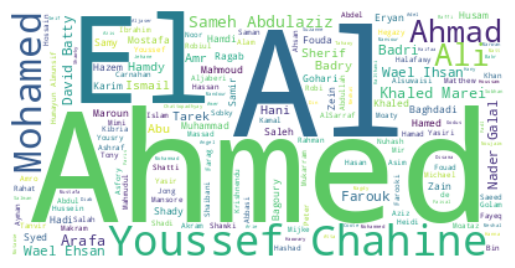

cluster 3


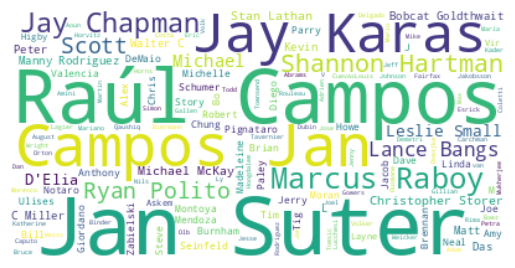

cluster 4


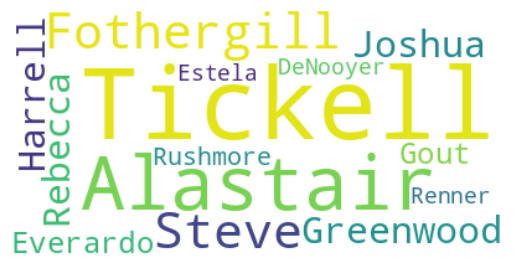

cluster 5


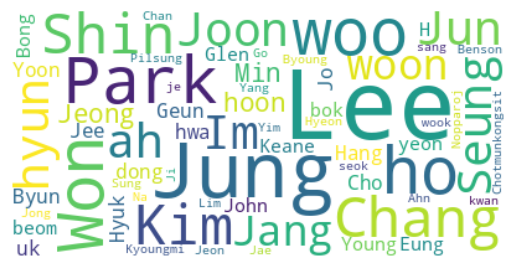

cluster 6


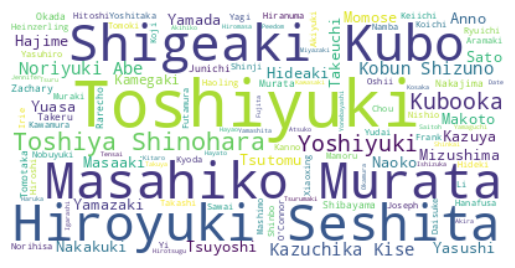

cluster 7


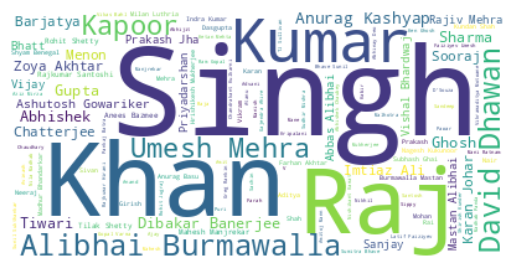

In [ ]:
#Description
for i in range(8):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'director')

**Word Cloud on "listed_in" column for different cluster**

cluster 0


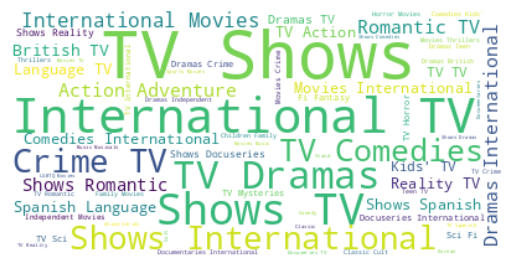

cluster 1


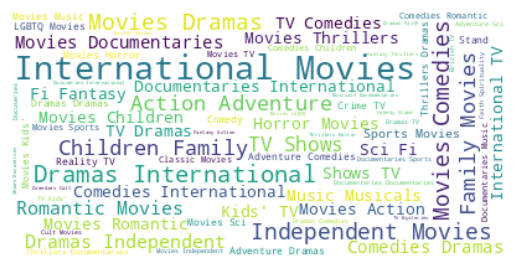

cluster 2


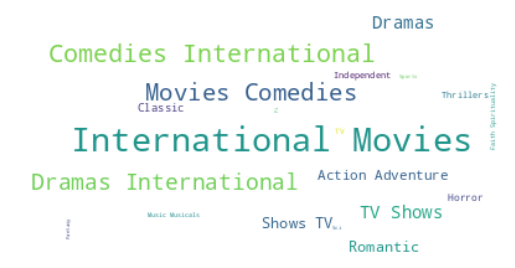

cluster 3


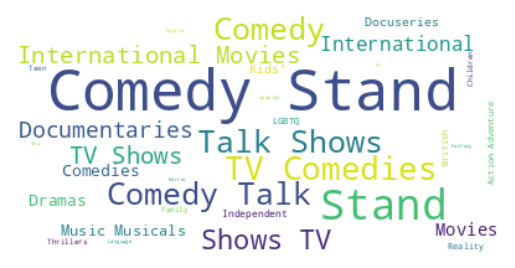

cluster 4


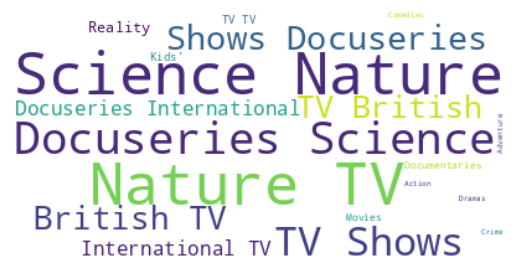

cluster 5


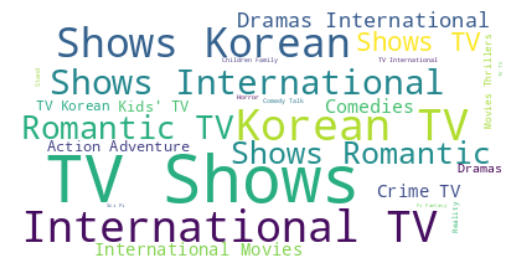

cluster 6


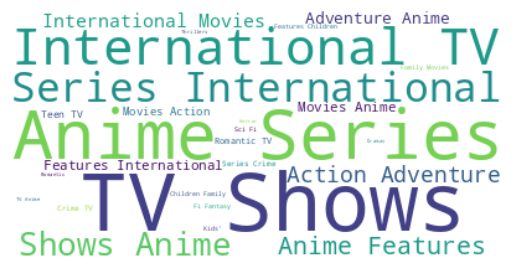

cluster 7


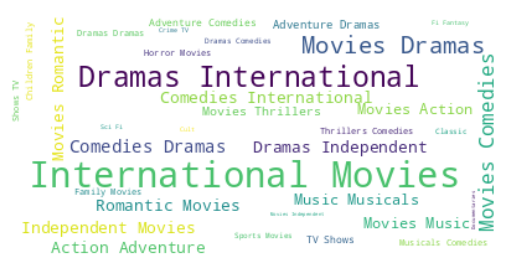

In [ ]:
#Description
for i in range(8):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'listed_in')

**Word Cloud on "country" column for different cluster**

cluster 0


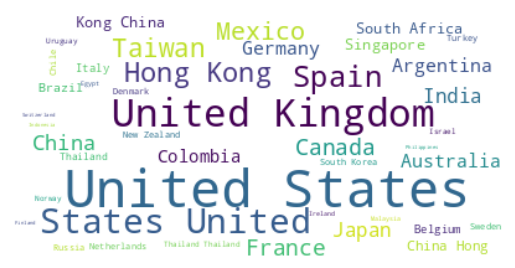

cluster 1


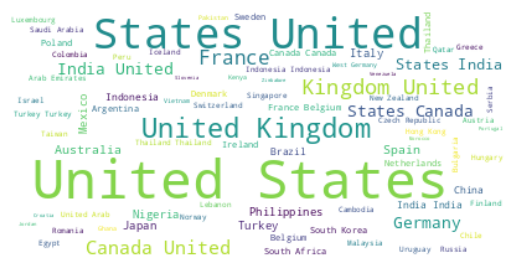

cluster 2


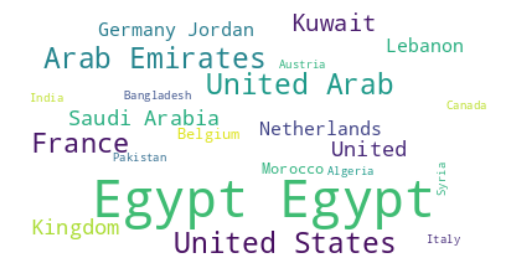

cluster 3


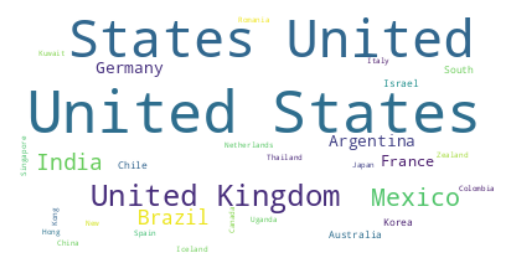

cluster 4


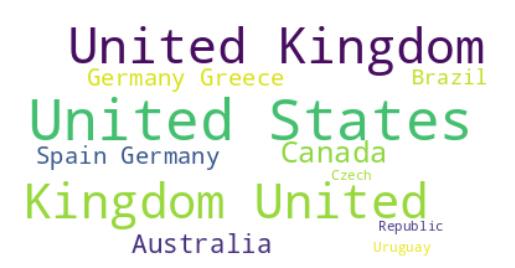

cluster 5


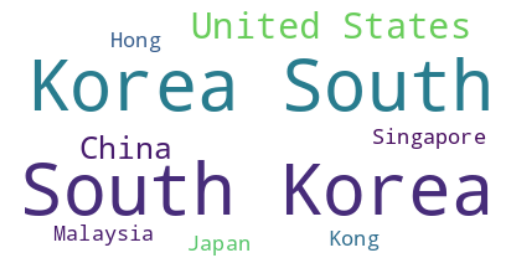

cluster 6


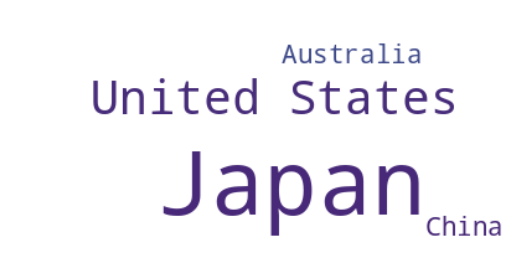

cluster 7


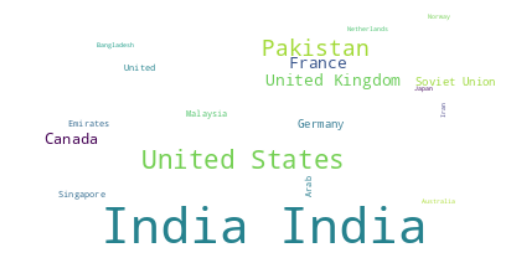

In [ ]:
#Description
for i in range(8):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'country')

**Word Cloud on "title" column for different cluster**

cluster 0


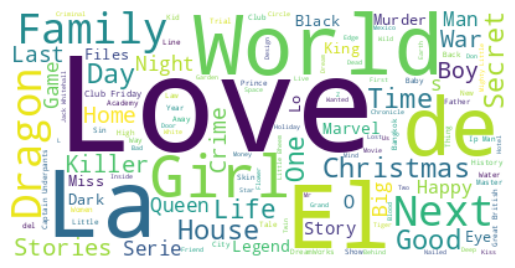

cluster 1


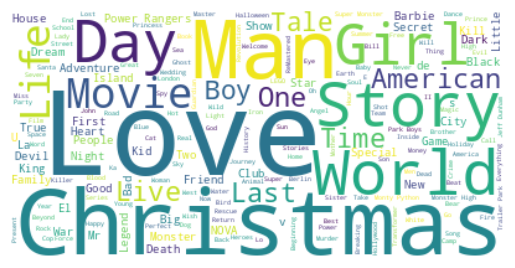

cluster 2


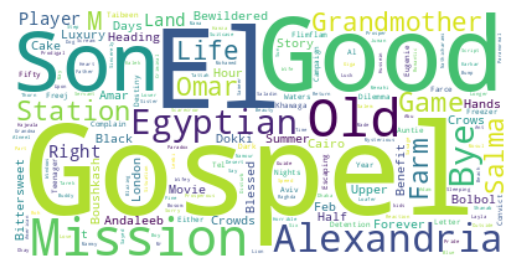

cluster 3


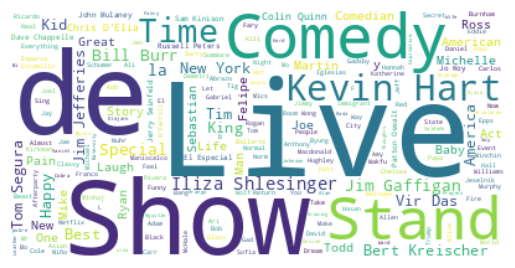

cluster 4


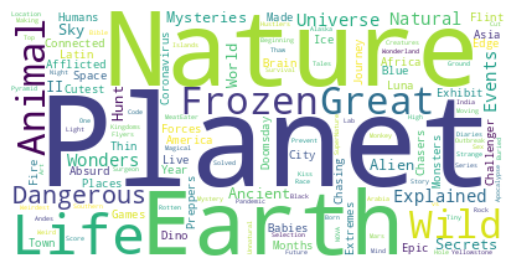

cluster 5


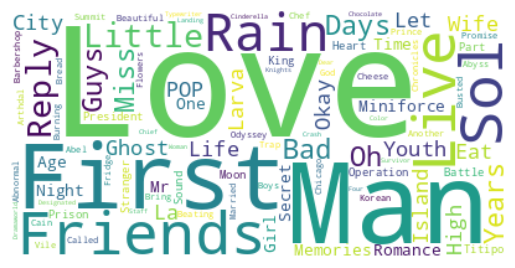

cluster 6


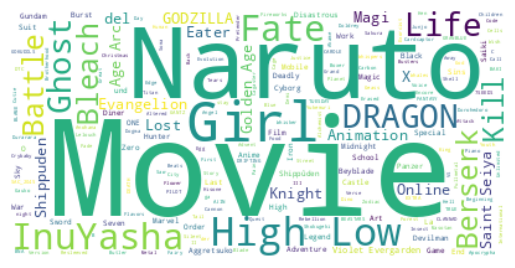

cluster 7


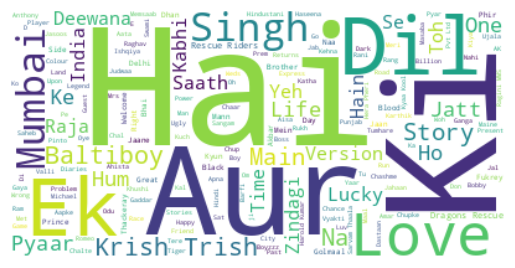

In [ ]:
#Description
for i in range(8):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'title')

**Content Based Recommendation System**

Content-based recommendation systems recommend items to a user by using the similarity of items. This recommender system recommends products or items based on their description or features. It identifies the similarity between the products based on their descriptions.

It short notes which items a particular user likes and also the items that the users with behavior and likings like him/her likes, to recommend items to that user.

We can build a simple content based recommender system based on the similarity of the movie/shows.
If a person has watched a show on Netflix, the recommender system must be able to recommend a list of similar shows that s/he likes.
To get the similarity score of the shows, we can use cosine similarity.
The similarity between two vectors (A and B) is calculated by taking the dot product of the two vectors and dividing it by the magnitude value. We can simply say that the cosine similarity score of two vectors increases as the angle between them decreases.

In [9]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [ ]:
data[['show_id','title','tags']]

,show_id,title,tags
0,s1,3%,futur elit inhabit island paradis far crowd sl...
1,s2,7:19,devast earthquak hit mexico citi trap survivor...
2,s3,23:59,armi recruit found dead fellow soldier forc co...
3,s4,9,postapocalypt world ragdol robot hide fear dan...
4,s5,21,brilliant group student becom cardcount expert...
...,...,...,...
7782,s7783,Zozo,lebanon civil war depriv zozo famili hes left ...
7783,s7784,Zubaan,scrappi poor boy worm way tycoon dysfunct fami...
7784,s7785,Zulu Man in Japan,documentari south african rapper nasti c hit s...
7785,s7786,Zumbo's Just Desserts,dessert wizard adriano zumbo look next “willi ...


1.The dataframe under consideration has a total of 7770 rows. However, due to the removal of some rows containing null values, the last index shown in the dataframe is 7786.

2.To build a content-based recommendation system, we calculate the similarity score based on a specific index_id with respect to the corresponding "tags" column.

3.Failure to reset the index may result in the calculation of cosine similarity for a different index, leading to incorrect recommendations. Hence, resetting the index is essential to ensure that the recommendations are based on the correct index.

4.Resetting the index involves assigning a new sequential index to each row of the dataframe, starting from 0. This ensures that each row has a unique and identifiable index, making it easier to perform computations and obtain accurate results.

5.Therefore, resetting the index is a crucial step in building a content-based recommendation system, as it ensures that the recommendations are based on the correct index and leads to more accurate and relevant recommendations.

In [ ]:
selected_columns = ['show_id', 'title', 'tags']

# Create a new DataFrame by selecting the specified columns from 'df'
selected_data = data[selected_columns]

# Display the new DataFrame, showing the 'show_id', 'title', and 'tags' columns
selected_data


,show_id,title,tags
0,s1,3%,futur elit inhabit island paradis far crowd sl...
1,s2,7:19,devast earthquak hit mexico citi trap survivor...
2,s3,23:59,armi recruit found dead fellow soldier forc co...
3,s4,9,postapocalypt world ragdol robot hide fear dan...
4,s5,21,brilliant group student becom cardcount expert...
...,...,...,...
7782,s7783,Zozo,lebanon civil war depriv zozo famili hes left ...
7783,s7784,Zubaan,scrappi poor boy worm way tycoon dysfunct fami...
7784,s7785,Zulu Man in Japan,documentari south african rapper nasti c hit s...
7785,s7786,Zumbo's Just Desserts,dessert wizard adriano zumbo look next “willi ...


In [ ]:
recommander_data = data.copy()

recommander_data.reset_index(inplace=True)

recommander_data[['show_id','title','tags']]

,show_id,title,tags
0,s1,3%,futur elit inhabit island paradis far crowd sl...
1,s2,7:19,devast earthquak hit mexico citi trap survivor...
2,s3,23:59,armi recruit found dead fellow soldier forc co...
3,s4,9,postapocalypt world ragdol robot hide fear dan...
4,s5,21,brilliant group student becom cardcount expert...
...,...,...,...
7765,s7783,Zozo,lebanon civil war depriv zozo famili hes left ...
7766,s7784,Zubaan,scrappi poor boy worm way tycoon dysfunct fami...
7767,s7785,Zulu Man in Japan,documentari south african rapper nasti c hit s...
7768,s7786,Zumbo's Just Desserts,dessert wizard adriano zumbo look next “willi ...


As you can see above dataframe We successfully reset the index. Now dataset is ready to build content based recommandation system

In [ ]:
recommander_data.drop(columns=['index','show_id'],inplace=True)

In [ ]:
print(f"before reset index id for movie 'Zero' : {data[data['title'] == 'Zero'].index[0]}")  # index[0] --> to locate index position
print(f"after reset index id for movie 'Zero': {recommander_data[recommander_data['title'] == 'Zero'].index[0]}")

before reset index id for movie 'Zero' : 7764
after reset index id for movie 'Zero': 7747


In [ ]:
x

array([[ 1.64742233e-01, -1.87656227e-04,  5.34957932e-03, ...,
         3.21805475e-03, -2.37843253e-03,  1.43486150e-03],
       [-4.39211529e-02, -1.25624310e-02, -1.14067417e-02, ...,
         4.42031263e-03, -5.48633111e-03, -5.06905298e-03],
       [-4.18023740e-02, -4.18474761e-02,  4.23545914e-02, ...,
         1.32716291e-02, -5.91061372e-03,  7.15299305e-03],
       ...,
       [-7.27563432e-02, -1.75690663e-02, -7.36613874e-02, ...,
        -1.07700913e-02, -2.53430787e-04,  4.74182926e-03],
       [ 6.92416158e-02,  3.69103997e-02, -2.52567717e-02, ...,
         9.32767446e-03,  7.73733927e-03,  3.84605549e-03],
       [-6.17251715e-02,  1.90419151e-01, -1.53007985e-01, ...,
        -4.64369218e-04,  7.56260249e-03,  6.70269199e-03]])

In [ ]:
similarity = cosine_similarity(x)
similarity

array([[ 1.        ,  0.08945623,  0.02255733, ..., -0.02361476,
         0.01043316, -0.02217486],
       [ 0.08945623,  1.        , -0.00317204, ...,  0.07223616,
        -0.01077566, -0.01049545],
       [ 0.02255733, -0.00317204,  1.        , ...,  0.00100078,
        -0.01026568, -0.01375445],
       ...,
       [-0.02361476,  0.07223616,  0.00100078, ...,  1.        ,
        -0.01545593,  0.05421083],
       [ 0.01043316, -0.01077566, -0.01026568, ..., -0.01545593,
         1.        ,  0.04236113],
       [-0.02217486, -0.01049545, -0.01375445, ...,  0.05421083,
         0.04236113,  1.        ]])

**Function for list down top 10 recommended movie on the basis of cosine similarity score.**

In [ ]:
def recommend(movie):
    '''
    This function list down top ten movies on the basis of similarity score for that perticular movie.
    '''
    print(f"If you liked '{movie}', you may also enjoy: \n")

    # find out index position
    index = recommander_data[recommander_data['title'] == movie].index[0]

    # sorting on the basis of simliarity score, In order to find out distaces from recommended one
    distances = sorted(list(enumerate(similarity[index])), reverse=True, key=lambda x: x[1])

    # listing top ten recommenaded movie
    for i in distances[1:11]:
        print(data.iloc[i[0]].title)

In [ ]:
recommend('Phir Hera Pheri')

If you liked 'Phir Hera Pheri', you may also enjoy: 

Bhool Bhulaiyaa
Thank You
Golmaal: Fun Unlimited
Chup Chup Ke
Bhagam Bhag
Ready
Khushi
Life in a ... Metro
Hattrick
Hasee Toh Phasee


In [ ]:
recommend('Life Story')

If you liked 'Life Story', you may also enjoy: 

Nature's Great Events: Diaries
Blue Planet II
Nature's Weirdest Events
Our Planet
Planet Earth II
The Hunt
The Making of Frozen Planet
Night on Earth
Planet Earth: The Complete Collection
Africa


In [ ]:
recommend('Marvel Anime: Wolverine')

If you liked 'Marvel Anime: Wolverine', you may also enjoy: 

Fullmetal Alchemist: Brotherhood
Code Geass: Lelouch of the Rebellion
Bleach the Movie: Hell Verse
Bleach
Marvel Anime: X-Men
Dino Girl Gauko
Naruto
Unabomber - In His Own Words
Berserk: The Golden Age Arc I - The Egg of the King
Little Witch Academia


### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

In conclusion, our journey through the world of Netflix shows has been an exhilarating one. We successfully clustered the shows into groups based on their similarities and differences, resulting in the creation of a content-based recommender system. This system takes into account key attributes such as director, cast, country, genre, rating, and description.

With over 7,787 records and 11 attributes, our exploration began by addressing missing values in the dataset and performing exploratory data analysis (EDA). We discovered that Netflix boasts a larger collection of movies compared to TV shows, with a significant presence of shows from the United States.

To tackle the challenge of dimensionality, we transformed the key attributes into a 10,000-feature TF-IDF vectorization and utilized Principal Component Analysis (PCA) to reduce the components to 3,000, capturing more than 80% of the variance.

By employing K-Means and Agglomerative clustering algorithms, we successfully grouped the shows into clusters. K-Means determined that 5 clusters were optimal based on the elbow method and Silhouette score analysis, while Agglomerative clustering suggested 7 clusters, visualized through a dendrogram.

The journey didn't end there. We went on to create a content-based recommender system that utilizes the cosine similarity matrix. This system provides personalized recommendations based on the user's viewing history, suggesting 10 top-notch shows to explore further.

Join us in experiencing the diverse world of Netflix shows and allow our recommender system to be your guide, leading you to your next binge-worthy obsession.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***